# Análisis de los sentimientos y opiniones sobre la esfera política de Cataluña en Redes sociales

In [2]:
import pandas as pd
from nltk.classify import NaiveBayesClassifier
import seaborn as sns
import nltk
import string
import re
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import roc_curve
from sklearn.preprocessing import label_binarize
from sklearn.metrics import auc
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_val_score
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import SVC
from wordcloud import WordCloud
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
import time
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score


c:\Users\Lenovo\anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Carga de datos

## Descripción Dataset

- **Página web:** https://github.com/ixa-ehu/catalonia-independence-corpus
- **Repositorio:** https://github.com/ixa-ehu/catalonia-independence-corpus
- **Paper:** [Multilingual Stance Detection: The Catalonia Independence Corpus](https://www.aclweb.org/anthology/2020.lrec-1.171/)
- **Contacto:** [Rodrigo Agerri](https://github.com/ragerri) (corpus creator)

### Resumen del Conjunto de Datos

Este conjunto de datos contiene dos corpus en español y catalán que consisten en mensajes de Twitter anotados para la detección automática de posturas. Los datos fueron recopilados durante 12 días en febrero y marzo de 2019 a partir de tweets publicados en Barcelona, y durante septiembre de 2018 a partir de tweets publicados en la ciudad de Terrassa, Cataluña.

Cada corpus está anotado con tres clases: EN CONTRA, A FAVOR y NEUTRAL, que expresan la postura hacia el objetivo - la independencia de Cataluña.


In [2]:
def load_data(file_path):
    '''
    la función load_data carga un archivo csv y lo convierte en un dataframe de pandas si el archivo es de tipo csv y si no lanza un error
    parámetros:
    file_path: str, dirección del archivo csv
    return: dataframe de pandas
    '''
    if file_path[-4:] != ".csv":
        raise TypeError("El fichero no tiene el formato correcto. Debe ser un csv")

load_data("C:\\TFG\\RawData\\Catalonian independence corpus\\spanish_train.csv")

df_train_es = pd.read_csv("C:\\TFG\\RawData\\Catalonian independence corpus\\spanish_train.csv", delimiter='\t', encoding='utf-8', on_bad_lines='skip')
df_train_es.head() 


,id_str,TWEET,LABEL
0,1.099284e+18,RT @EFEnoticias: Arrimadas se presenta a las g...,AGAINST
1,1.102570e+18,@gabrielrufian Derecho a la autodeterminación ...,AGAINST
2,1.097577e+18,#URGENTE ???? #Cataluña: Los CDR atacan con pi...,AGAINST
3,1.097476e+18,Cansado de los eslóganes de izquierdas y derec...,AGAINST
4,1.093134e+18,Le recuerdo a @EnricJuliana que en Cataluña lo...,NEUTRAL


In [3]:
load_data("C:\\TFG\\RawData\\Catalonian independence corpus\\catalan_train.csv")

df_train_ca = pd.read_csv("C:\\TFG\\RawData\\Catalonian independence corpus\\catalan_train.csv", delimiter='\t', encoding='utf-8', on_bad_lines='skip')
df_train_ca.head() 

,id_str,TWEET,LABEL
0,1.102852e+34,En @fgarrobo ha fet més per l’independentisme ...,AGAINST
1,1.098893e+18,Divendres 22F acte Cloenda campanya de les can...,FAVOR
2,1.099032e+34,Puigdemont porta a la Defensora del Poble euro...,NEUTRAL
3,1.102519e+32,"José Antonio Nieto, ex-secretari d'Estat de Se...",NEUTRAL
4,1.093082e+18,Es passen dies denunciant l'autocar amb que va...,FAVOR


In [4]:
load_data("C:\\TFG\\RawData\\Catalonian independence corpus\\spanish_test.csv")
df_test_es = pd.read_csv("C:\\TFG\\RawData\\Catalonian independence corpus\\spanish_test.csv", delimiter='\t', encoding='utf-8', on_bad_lines='skip')
df_test_es.head()

,id_str,TWEET,LABEL
0,1.097764e+18,En Valencia se pasa hambre pero no parece ser ...,AGAINST
1,1.103350e+18,Así era el proyecto de Constitución catalana: ...,AGAINST
2,1.097806e+18,Necesitamos un Gobierno valiente y que defien...,AGAINST
3,1.095963e+18,“Joder con los indepes que no se venden como h...,FAVOR
4,1.103603e+18,Antoni Puigverd se queja de que Millo no facil...,AGAINST


In [5]:
load_data("C:\\TFG\\RawData\\Catalonian independence corpus\\catalan_test.csv")
df_test_ca = pd.read_csv("C:\\TFG\\RawData\\Catalonian independence corpus\\catalan_test.csv", delimiter='\t', encoding='utf-8', on_bad_lines='skip')
df_test_ca.head()


,id_str,TWEET,LABEL
0,1.038342e+18,Albert Rivera està desesperat. La sort se li h...,FAVOR
1,1.093196e+34,RT @CUPestatcatala: si hi ha intervenció milit...,NEUTRAL
2,1.102969e+34,"Avui, tot l'alumnat de #2ESO ha cuinat crêpes ...",AGAINST
3,1.037684e+18,RT @AlbanoDante76: Mitja hora més tard Carme F...,FAVOR
4,1.097584e+33,"Moltes gràcies a tots i totes les assistents, ...",AGAINST


In [6]:
load_data("C:\\TFG\\RawData\\Catalonian independence corpus\\spanish_val.csv")
# el encoding de los archivos debe permitir leer los caracteres especiales como tildes y ñ del español
df_val_es = pd.read_csv("C:\\TFG\\RawData\\Catalonian independence corpus\\spanish_val.csv", delimiter='\t', encoding='utf-8', on_bad_lines='skip')
df_val_es.head()

,id_str,TWEET,LABEL
0,1.098901e+18,Recuerda que #AntonioMachado se exilió para qu...,FAVOR
1,1.098884e+18,Un problema llamado federalismo. Mientras no n...,FAVOR
2,1.046494e+18,#FelizSábado Mi apoyo y cariño para la gran pe...,AGAINST
3,1.092208e+18,@iguardans Lo digo porque muchos que jamás se ...,AGAINST
4,1.096002e+18,@publico_es @Alopezdemiguel El juicio a los pr...,FAVOR


In [7]:
load_data("C:\\TFG\\RawData\\Catalonian independence corpus\\catalan_val.csv")
df_val_ca = pd.read_csv("C:\\TFG\\RawData\\Catalonian independence corpus\\catalan_val.csv", delimiter='\t', encoding='utf-8', on_bad_lines='skip')
df_val_ca.head()

,id_str,TWEET,LABEL
0,1.096087e+18,@laxarxaxanante1 @Capidja @Foxxthefox @estartu...,FAVOR
1,1.102929e+34,Els organitzadors del Tanga! Party de Madrid...,NEUTRAL
2,1.097456e+34,@Gemma51185456 @oriolguellipuig @OusmanJK Deus...,AGAINST
3,1.102456e+18,🗳 #Municipals2019BCN | Ferran Mascarell presen...,FAVOR
4,1.099388e+34,El president Puigdemont reitera des de Waterlo...,NEUTRAL


Se van a combinar los conjuntos de datos en función de su idioma para acceder al corpus completo de tweets en español y catalán

In [8]:
# combinar los datos de train, test y validación en español
independencia_df_es = pd.concat([df_train_es, df_test_es, df_val_es])
independencia_df_es.head()

,id_str,TWEET,LABEL
0,1.099284e+18,RT @EFEnoticias: Arrimadas se presenta a las g...,AGAINST
1,1.102570e+18,@gabrielrufian Derecho a la autodeterminación ...,AGAINST
2,1.097577e+18,#URGENTE ???? #Cataluña: Los CDR atacan con pi...,AGAINST
3,1.097476e+18,Cansado de los eslóganes de izquierdas y derec...,AGAINST
4,1.093134e+18,Le recuerdo a @EnricJuliana que en Cataluña lo...,NEUTRAL


In [9]:
# combinar los datos de train, test y validación en catalán
independencia_df_ca = pd.concat([df_train_ca, df_test_ca, df_val_ca])
independencia_df_ca.head()


,id_str,TWEET,LABEL
0,1.102852e+34,En @fgarrobo ha fet més per l’independentisme ...,AGAINST
1,1.098893e+18,Divendres 22F acte Cloenda campanya de les can...,FAVOR
2,1.099032e+34,Puigdemont porta a la Defensora del Poble euro...,NEUTRAL
3,1.102519e+32,"José Antonio Nieto, ex-secretari d'Estat de Se...",NEUTRAL
4,1.093082e+18,Es passen dies denunciant l'autocar amb que va...,FAVOR


In [10]:
# Dimensiones del dataset
print('Dimensión del dataset en español:',independencia_df_es.shape)
print('Columnas del dataset en español:', independencia_df_es.columns)

Dimensión del dataset en español: (10077, 3)
Columnas del dataset en español: Index(['id_str', 'TWEET', 'LABEL'], dtype='object')


In [11]:
# Dimensiones del dataset
print('Dimensión del dataset en catalán:',independencia_df_ca.shape)
print('Columnas del dataset en catalán:', independencia_df_ca.columns)

Dimensión del dataset en catalán: (10048, 3)
Columnas del dataset en catalán: Index(['id_str', 'TWEET', 'LABEL'], dtype='object')


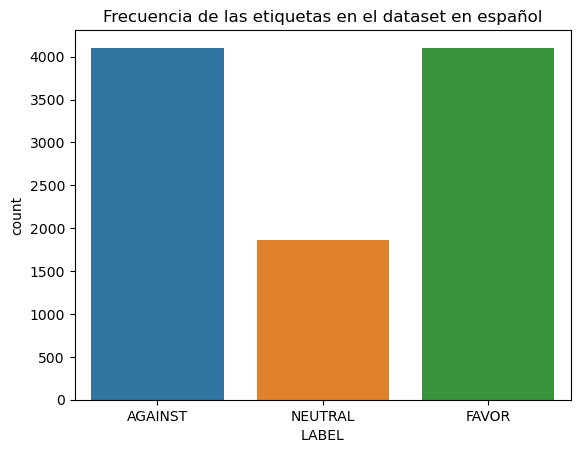

In [219]:
# gráfico de barras frecuencia de las etiquetas en el dataset en español
sns.countplot(x = 'LABEL', data = independencia_df_es)
plt.title('Frecuencia de las etiquetas en el dataset en español')
# se guarda la imagen en la carpeta de Doc
plt.savefig('C:\\TFG\\Images\\frecuencia_etiquetas_es_original.png')

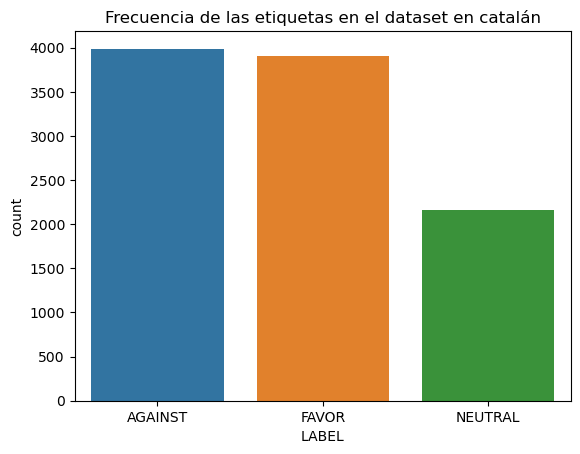

In [220]:
# gráfico de barras frecuencia de las etiquetas en el dataset en catalán
sns.countplot(x = 'LABEL', data = independencia_df_ca)
plt.title('Frecuencia de las etiquetas en el dataset en catalán')
plt.savefig('C:\\TFG\\Images\\frecuencia_etiquetas_ca_original.png')

In [12]:
# frecuencia de las etiquetas en el dataset en español
independencia_df_es['LABEL'].value_counts()

AGAINST    4105
FAVOR      4104
NEUTRAL    1868
Name: LABEL, dtype: int64

In [13]:
# frecuencia de las etiquetas en el dataset en catalán
independencia_df_ca['LABEL'].value_counts()

AGAINST    3988
FAVOR      3902
NEUTRAL    2158
Name: LABEL, dtype: int64

Hasta este momento he realizado la carga de datos y la visualización del balance por frecuencia de las etiquetas. Se puede observar que los datasets en español y catalán tienen distinto número de clases y etiquetas. También se observa que el dataset está desbalanceado, por lo que se deberá realizar un balanceo de los datos. Para esto se considerará la técnica de sobremuestreo de las clases minoritarias. Aunque se podría considerar incluir un ligero desbalanceo del dataset para reflejar la realidad de la distribución de las clases en la vida real.Todo esto depende de las consiguientes etapas de limpieza y preprocesamiento.

En ambos casos, la investigación previa realizada por el autor del dataset demuestra que el catalán es un idioma más neutro en cuanto a los sentimientos de los tweets, ya que hay un número menor de tweets positivos y negativos en comparación con el dataset en español. Aunque en ambos casos el sentimiento dominante es en contra de la independencia de Cataluña.

In [14]:
# Se cambian los valores de la columna LABEL del dataset español
independencia_df_es['LABEL'] = independencia_df_es['LABEL'].map({'AGAINST': 'Negativo', 'FAVOR': 'Positivo', 'NEUTRAL': 'Neutral'})
# Se cambian los valores de la columna LABEL del dataset en catalán
independencia_df_ca['LABEL'] = independencia_df_ca['LABEL'].map({'AGAINST': 'Negativo', 'FAVOR': 'Positivo', 'NEUTRAL': 'Neutral'})
# se cambia de nombre a las columnas
independencia_df_es = independencia_df_es.rename(columns={'id_str':'Id', 'LABEL':'Sentimiento', 'TWEET':'Texto'})
# se cambia de nombre a las columnas
independencia_df_ca = independencia_df_ca.rename(columns={'id_str':'Id', 'LABEL':'Sentimiento', 'TWEET':'Texto'})

In [15]:
independencia_df_es.head()

,Id,Texto,Sentimiento
0,1.099284e+18,RT @EFEnoticias: Arrimadas se presenta a las g...,Negativo
1,1.102570e+18,@gabrielrufian Derecho a la autodeterminación ...,Negativo
2,1.097577e+18,#URGENTE ???? #Cataluña: Los CDR atacan con pi...,Negativo
3,1.097476e+18,Cansado de los eslóganes de izquierdas y derec...,Negativo
4,1.093134e+18,Le recuerdo a @EnricJuliana que en Cataluña lo...,Neutral


In [16]:
independencia_df_ca.head()

,Id,Texto,Sentimiento
0,1.102852e+34,En @fgarrobo ha fet més per l’independentisme ...,Negativo
1,1.098893e+18,Divendres 22F acte Cloenda campanya de les can...,Positivo
2,1.099032e+34,Puigdemont porta a la Defensora del Poble euro...,Neutral
3,1.102519e+32,"José Antonio Nieto, ex-secretari d'Estat de Se...",Neutral
4,1.093082e+18,Es passen dies denunciant l'autocar amb que va...,Positivo


## Visualización de las nubes de palabras de los datos originales

In [17]:
# Segmentación de los datos por sentimiento
def data_segmentation(df, columna):
    '''
    la función data_segmentation recibe un dataframe y segmenta los datos por sentimiento
    parámetros:
    - df: conjunto de datos
    retorna:
    - texto_positivo: subgrupo con sentimiento positivo
    - texto_negativo: subgrupo con sentimiento negativo
    - texto_neutral: subgrupo con sentimiento neutral
    '''
    df_positivo = df[df['Sentimiento'] == 'Positivo'] 
    df_negativo = df[df['Sentimiento'] == 'Negativo']
    df_neutral = df[df['Sentimiento'] == 'Neutral']
    texto_positivo = " ".join(str(review) for review in df_positivo[columna])
    texto_negativo = " ".join(str(review) for review in df_negativo[columna])
    texto_neutral = " ".join(str(review) for review in df_neutral[columna])
    return texto_positivo, texto_negativo, texto_neutral



In [18]:
# se aplica la función preprocess_data para segmentar los datos en español
texto_positivo_es, texto_negativo_es, texto_neutral_es = data_segmentation(independencia_df_es, 'Texto')
texto_positivo_ca, texto_negativo_ca, texto_neutral_ca = data_segmentation(independencia_df_ca, 'Texto')

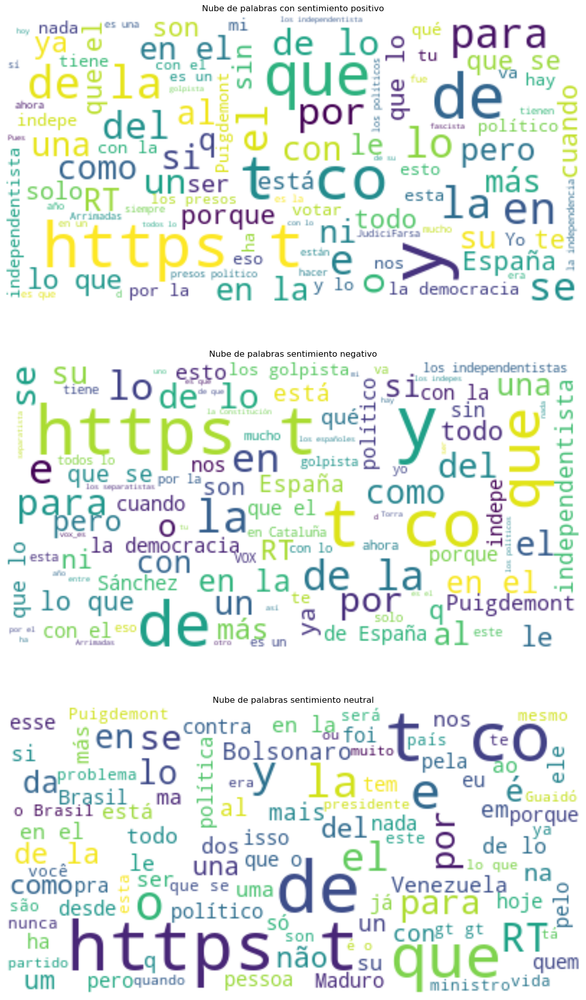

In [206]:
# representación gráfica de las nubes de palabras de cada subgrupo
fig, ax = plt.subplots(3, 1, figsize  = (25, 25))
wordcloud_positivo_es = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_positivo_es)
wordcloud_negativo_es = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_negativo_es)
wordcloud_neutral_es = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_neutral_es)

ax[0].imshow(wordcloud_positivo_es, interpolation='bilinear')
ax[0].set_title('Nube de palabras con sentimiento positivo')
ax[0].axis('off')
ax[1].imshow(wordcloud_negativo_es, interpolation='bilinear')
ax[1].set_title('Nube de palabras sentimiento negativo')
ax[1].axis('off')
ax[2].imshow(wordcloud_neutral_es, interpolation='bilinear')
ax[2].set_title('Nube de palabras sentimiento neutral')
ax[2].axis('off')
plt.savefig('C:\\TFG\\Images\\nubes_palabras_es_original.png')

Palabras como https, que , y, de, para  y otras preposiciones tienen una frecuencia muy alta de aparición. Entonces, el texto necesita ser preprocesado para eliminar estas palabras y evitar que afecten al rendimiento del modelo. Por lo tanto, lo mismo debe de suceder al texto en catalán

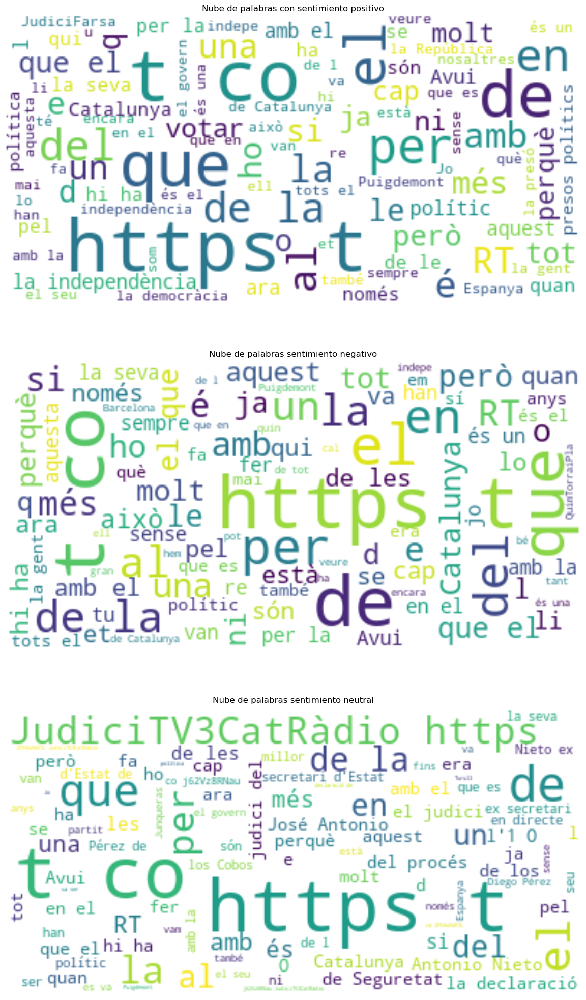

In [207]:
# representación gráfica de las nubes de palabras de cada subgrupo
fig, ax = plt.subplots(3, 1, figsize  = (25, 25))
wordcloud_positivo_ca = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_positivo_ca)
wordcloud_negativo_ca = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_negativo_ca)
wordcloud_neutral_ca = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_neutral_ca)

ax[0].imshow(wordcloud_positivo_ca, interpolation='bilinear')
ax[0].set_title('Nube de palabras con sentimiento positivo')
ax[0].axis('off')
ax[1].imshow(wordcloud_negativo_ca, interpolation='bilinear')
ax[1].set_title('Nube de palabras sentimiento negativo')
ax[1].axis('off')
ax[2].imshow(wordcloud_neutral_ca, interpolation='bilinear')
ax[2].set_title('Nube de palabras sentimiento neutral')
ax[2].axis('off')
plt.savefig('C:\\TFG\\Images\\nubes_palabras_ca_original.png')

Según lo aprendido en la última investigación del propcesamiento de lenguaje natural con técnica basada en el léxico, se unificarán todas las funciones de limpieza y preprocesado del texto para mejorar el rendimiento del tiempo de ejecución y la legibilidad del código.

## Preprocesamiento de los datos

In [19]:
def preprocess_text_independence_es(tweet):
    '''
    la función preprocess_text_independence recibe un tweet y realiza una serie de transformaciones
    parámetros:
    - tweet: texto del tweet en español
    retorna:
    - text: texto preprocesado en español
    '''
    text = re.sub(r'@\w+|#\w+', '', tweet)
    # se eliminan los signos de puntuación de cada tweet
    text = "".join([char for char in text if char not in string.punctuation])
    # se eliminan los digitos numéricos de cada tweet
    text = re.sub('[0-9]+', '', text)
    emojis = re.compile("["
                        u"\U0001F600-\U0001F64F"  # emoticonos
                        u"\U0001F300-\U0001F5FF"  # símbolos y emoticonos
                        u"\U0001F680-\U0001F6FF"  # emoticonos suplementarios
                        u"\U0001F900-\U0001F9FF"  # emoticonos ideográficos
                        u"\U0001FA00-\U0001FA6F"  # emoticonos de símbolos diversos
                        u"\U0001FA70-\U0001FAFF"  # emoticonos de transporte y objetos
                        u"\U0001F000-\U0001F0FF"  
                        u"\U00002702-\U000027B0"
                        u"\U000024C2-\U0001F251"
                        "]+", flags=re.UNICODE)
    text = emojis.sub('', text)
    # se eliminan las URL que empiezan por http
    text = re.sub(r'http\S+', '', text)
    # se eliminan las URL que empiezan por www
    text = re.sub(r'www\S+', '', text)
    # se eliminan las URL que empiezan por https
    text = re.sub(r'https\S+', '', text)
    # se tokenizan los tweets
    text = re.split('\W+', text.lower())
    # se elimina el token 'rt'
    text = [word for word in text if word != 'rt']
    # se eliminan los tokens en blanco
    text = [word for word in text if word.isalnum()]
    # se cargan las stopwords en español
    stopword = nltk.corpus.stopwords.words('spanish')
    # se eliminan las stopwords de los tweets
    text = [word for word in text if word not in stopword]
    # se invoca la función de lematización de la librería nltk
    WNL = nltk.WordNetLemmatizer()
    # se lematiza el texto de los tweets
    text = [WNL.lemmatize(word) for word in text]
    return text


In [20]:
def preprocess_text_independence_ca(tweet):
    '''
    la función preprocess_text_independence recibe un tweet y realiza una serie de transformaciones
    parámetros:
    - tweet: texto del tweet en catalán
    retorna:
    - text: texto preprocesado en catalán
    '''
    text = re.sub(r'@\w+|#\w+', '', tweet)
    # se eliminan los signos de puntuación de cada tweet
    text = "".join([char for char in text if char not in string.punctuation])
    # se eliminan los digitos numéricos de cada tweet
    text = re.sub('[0-9]+', '', text)
    emojis = re.compile("["
                        u"\U0001F600-\U0001F64F"  # emoticonos
                        u"\U0001F300-\U0001F5FF"  # símbolos y emoticonos
                        u"\U0001F680-\U0001F6FF"  # emoticonos suplementarios
                        u"\U0001F900-\U0001F9FF"  # emoticonos ideográficos
                        u"\U0001FA00-\U0001FA6F"  # emoticonos de símbolos diversos
                        u"\U0001FA70-\U0001FAFF"  # emoticonos de transporte y objetos
                        u"\U0001F000-\U0001F0FF"  
                        u"\U00002702-\U000027B0"
                        u"\U000024C2-\U0001F251"
                        "]+", flags=re.UNICODE)
    text = emojis.sub('', text)
    # se eliminan las URL que empiezan por http
    text = re.sub(r'http\S+', '', text)
    # se eliminan las URL que empiezan por www
    text = re.sub(r'www\S+', '', text)
    # se eliminan las URL que empiezan por https
    text = re.sub(r'https\S+', '', text)
    # se tokenizan los tweets
    text = re.split('\W+', text.lower())
    # se elimina el token 'rt'
    text = [word for word in text if word != 'rt']
    # se eliminan los tokens en blanco
    text = [word for word in text if word.isalnum()]
    # se cargan las stopwords en español
    stopword = nltk.corpus.stopwords.words('catalan')
    # se eliminan las stopwords de los tweets
    text = [word for word in text if word not in stopword]
    # se invoca la función de lematización de la librería nltk
    WNL = nltk.WordNetLemmatizer()
    # se lematiza el texto de los tweets
    text = [WNL.lemmatize(word) for word in text]
    return text


In [21]:
# se aplica la función preprocess_text_independence al dataset en español
independencia_df_es['Texto_preprocesado'] = independencia_df_es['Texto'].apply(lambda x: preprocess_text_independence_es(x))
# se aplica la función remove_mentions_and_hastags al dataset en catalán
independencia_df_ca['Texto_preprocesado'] = independencia_df_ca['Texto'].apply(lambda x: preprocess_text_independence_ca(x))

### Se aislan los textos que contienen palabras con sesgo de género

En el estudio previo, hemos observado que las palabras con sesgo de género están directamente relacionadas con el sexo de las personas . Por lo tanto, se deberán aislar estas palabras para realizar un análisis más detallado de los tweets que contienen sesgo de género.

In [22]:
sesgo_español = ['mujer', 'señora', 'señorita', 'femenina', 'niña', 'ella', 'hija', 'chica', 'hermana', 'madre', 'tía', 'abuela',
                 'hombre', 'señor', 'caballero', 'masculino', 'niño', 'él', 'hijo', 'chico', 'hermano', 'padre', 'tío', 'abuelo', 'nieto',
                 'mujeres', 'señoras', 'señoritas', 'femeninas', 'niñas', 'ellas', 'hijas', 'chicas', 'hermanas', 'madres', 'tías', 'abuelas',
                 'hombres', 'señores', 'caballeros', 'masculinos', 'niños', 'ellos', 'hijos', 'chicos', 'hermanos', 'padres', 'tíos', 'abuelos', 'nietos']
sesgo_catalan = ['dona', 'senyora', 'senyoreta', 'femenina', 'nena', 'ella', 'filla', 'noia', 'germana', 'mare', 'tia', 'àvia',
                 'home', 'senyor', 'cavaller', 'masculí', 'nen', 'ell', 'fill', 'noi', 'germà', 'pare', 'oncle', 'avi', 'nét',
                 'dones', 'senyores', 'senyorites', 'femenines', 'nenes', 'elles', 'filles', 'noies', 'germanes', 'mares', 'tietes', 'àvies',
                 'homes', 'senyors', 'cavallers', 'masculins', 'nens', 'ells', 'fills', 'nois', 'germans', 'pares', 'oncles', 'avis', 'néts']

In [23]:
filas_totales_español = len(independencia_df_es)
filas_totales_catalan = len(independencia_df_ca)
# si palabras con sesgo de género están en la columna Texto_lemmatized_ca texto entonces aislar fila en un dataset aparte
independencia_df_es_sesgo = independencia_df_es['Texto_preprocesado'].apply(lambda x: any(item in x for item in sesgo_español))
independencia_df_es_sesgo = independencia_df_es[independencia_df_es_sesgo]
independencia_df_ca_sesgo = independencia_df_ca['Texto_preprocesado'].apply(lambda x: any(item in x for item in sesgo_catalan))
independencia_df_ca_sesgo = independencia_df_ca[independencia_df_ca_sesgo]

In [24]:
independencia_df_es_sesgo.Sentimiento.value_counts().sum()

664

In [25]:
independencia_df_ca_sesgo.Sentimiento.value_counts().sum()

666

## Se representa la nube de palabras postprocesadas

In [26]:
# Segmentación de los datos por sentimiento
def data_preprocessed_segmented(df, columna):
    '''
    la función data_preprocessed_segmented recibe un dataframe y segmenta los datos por sentimiento
    parámetros:
    - df: conjunto de datos
    retorna:
    - texto_positivo: subgrupo con sentimiento positivo
    - texto_negativo: subgrupo con sentimiento negativo
    - texto_neutral: subgrupo con sentimiento neutral
    '''
    df_positivo = df[df['Sentimiento'] == 'Positivo']
    df_neutral = df[df['Sentimiento'] == 'Neutral']
    df_negativo = df[df['Sentimiento'] == 'Negativo']
    # extraer tokens de la columna texto_token
    texto_positivo = " ".join(str(review) for review in df_positivo[columna].tolist())
    texto_negativo = " ".join(str(review) for review in df_negativo[columna].tolist())
    texto_neutral = " ".join(str(review) for review in df_neutral[columna].tolist())
    return texto_positivo, texto_negativo, texto_neutral

texto_positivo_ca, texto_negativo_ca, texto_neutral_ca = data_preprocessed_segmented(independencia_df_ca, 'Texto_preprocesado')
texto_positivo_es, texto_negativo_es, texto_neutral_es = data_preprocessed_segmented(independencia_df_es, 'Texto_preprocesado')
texto_positivo_sesgo_ca, texto_negativo_sesgo_ca, texto_neutral_sesgo_ca = data_preprocessed_segmented(independencia_df_ca_sesgo, 'Texto_preprocesado')
texto_positivo_sesgo_es, texto_negativo_sesgo_es, texto_neutral_sesgo_es = data_preprocessed_segmented(independencia_df_es_sesgo, 'Texto_preprocesado')


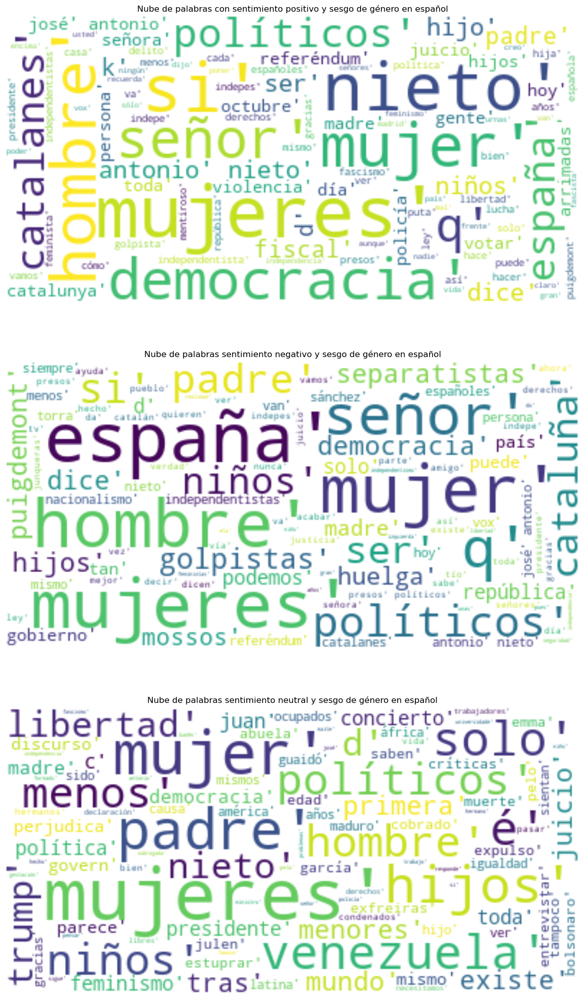

In [125]:
fig, ax = plt.subplots(3, 1, figsize  = (25, 25))
wordcloud_positivo_es = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_positivo_sesgo_es)
wordcloud_neutral_es = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_neutral_sesgo_es)
wordcloud_negativo_es = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_negativo_sesgo_es)
ax[0].imshow(wordcloud_positivo_es, interpolation='bilinear')
ax[0].set_title('Nube de palabras con sentimiento positivo y sesgo de género en español')
ax[0].axis('off')
ax[1].imshow(wordcloud_negativo_es, interpolation='bilinear')
ax[1].set_title('Nube de palabras sentimiento negativo y sesgo de género en español')
ax[1].axis('off')
ax[2].imshow(wordcloud_neutral_es, interpolation='bilinear')
ax[2].set_title('Nube de palabras sentimiento neutral y sesgo de género en español')
ax[2].axis('off')
plt.savefig('C:\\TFG\\Images\\nubes_palabras_preprocesadas_es_sesgo.png')

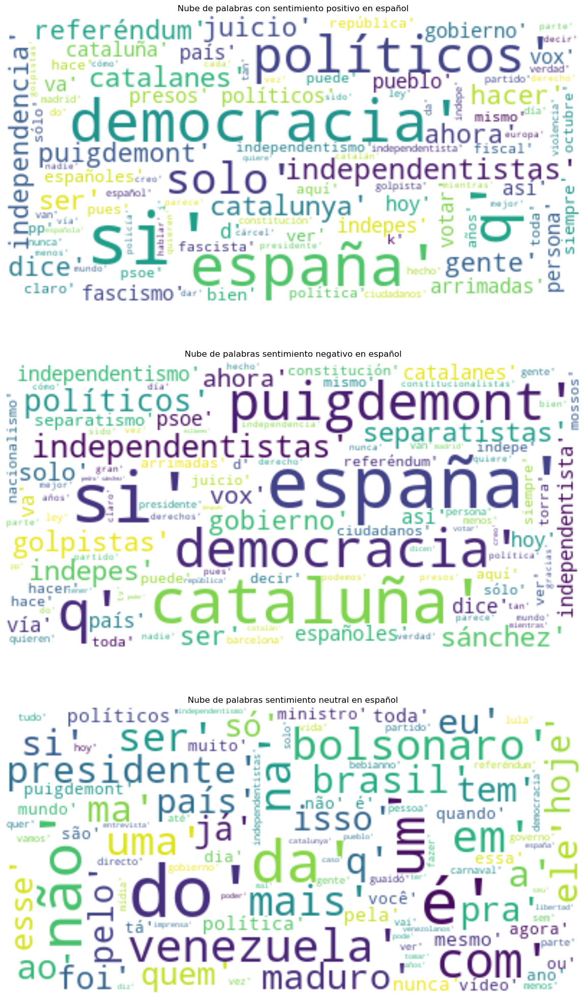

In [126]:
fig, ax = plt.subplots(3, 1, figsize  = (25, 25))
wordcloud_positivo_es = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_positivo_es)
wordcloud_neutral_es = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_neutral_es)
wordcloud_negativo_es = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_negativo_es)
ax[0].imshow(wordcloud_positivo_es, interpolation='bilinear')
ax[0].set_title('Nube de palabras con sentimiento positivo en español')
ax[0].axis('off')
ax[1].imshow(wordcloud_negativo_es, interpolation='bilinear')
ax[1].set_title('Nube de palabras sentimiento negativo en español')
ax[1].axis('off')
ax[2].imshow(wordcloud_neutral_es, interpolation='bilinear')
ax[2].set_title('Nube de palabras sentimiento neutral en español')
ax[2].axis('off')
plt.savefig('C:\\TFG\\Images\\nubes_palabras_preprocesadas_es.png')

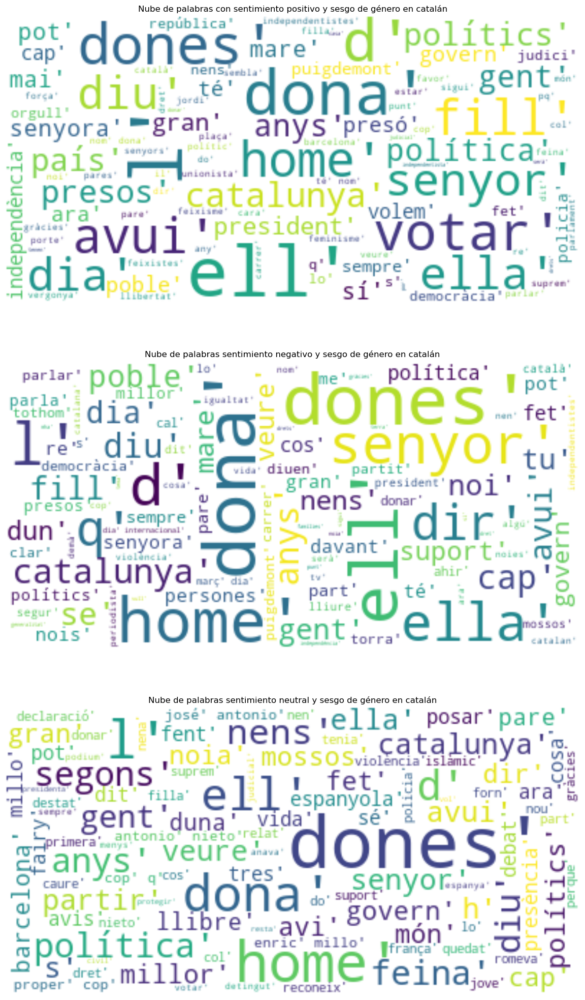

In [127]:
fig, ax = plt.subplots(3, 1, figsize  = (25, 25))
wordcloud_positivo_ca = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_positivo_sesgo_ca)
wordcloud_negativo_ca = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_negativo_sesgo_ca)
wordcloud_neutral_ca = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_neutral_sesgo_ca)
ax[0].imshow(wordcloud_positivo_ca, interpolation='bilinear')
ax[0].set_title('Nube de palabras con sentimiento positivo y sesgo de género en catalán')
ax[0].axis('off')
ax[1].imshow(wordcloud_negativo_ca, interpolation='bilinear')
ax[1].set_title('Nube de palabras sentimiento negativo y sesgo de género en catalán')
ax[1].axis('off')
ax[2].imshow(wordcloud_neutral_ca, interpolation='bilinear')
ax[2].set_title('Nube de palabras sentimiento neutral y sesgo de género en catalán')
ax[2].axis('off')
plt.savefig('C:\\TFG\\Images\\nubes_palabras_preprocesadas_ca_sesgo.png')

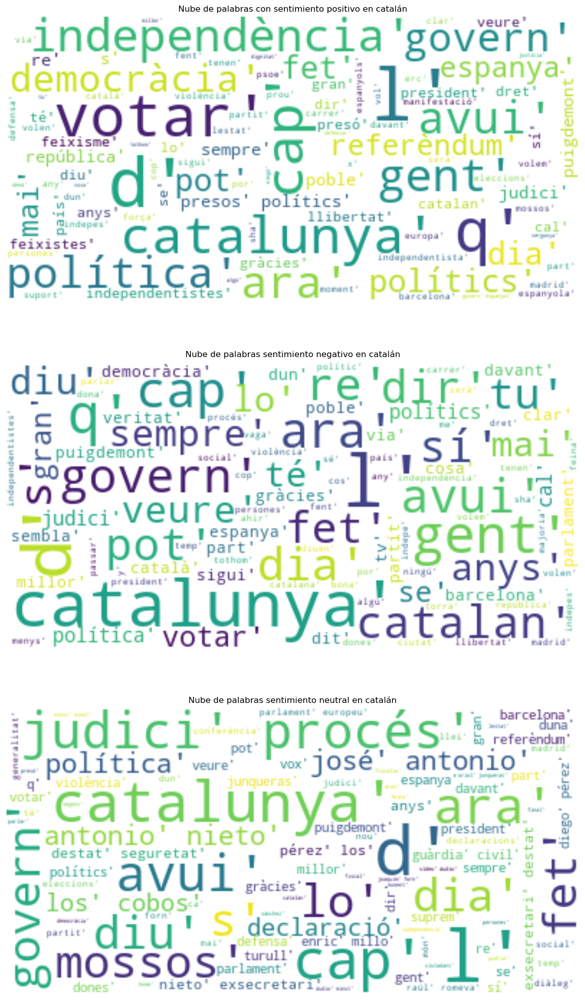

In [128]:
fig, ax = plt.subplots(3, 1, figsize  = (25, 25))
wordcloud_positivo_ca = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_positivo_ca)
wordcloud_negativo_ca = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_negativo_ca)
wordcloud_neutral_ca = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(texto_neutral_ca)
ax[0].imshow(wordcloud_positivo_ca, interpolation='bilinear')
ax[0].set_title('Nube de palabras con sentimiento positivo en catalán')
ax[0].axis('off')
ax[1].imshow(wordcloud_negativo_ca, interpolation='bilinear')
ax[1].set_title('Nube de palabras sentimiento negativo en catalán')
ax[1].axis('off')
ax[2].imshow(wordcloud_neutral_ca, interpolation='bilinear')
ax[2].set_title('Nube de palabras sentimiento neutral en catalán')
ax[2].axis('off')
plt.savefig('C:\\TFG\\Images\\nubes_palabras_preprocesadas_ca.png')

Al final de todas estas modificaciones, se observa que el proceso de limpieza y preprocesamiento de los datos ha sido efectivo. Ahora aparecen palabras relacionadas directamente con la política, el gobierno y las palabras clave del objeto de estudio. Existe una mayor presencia de palabras relacionadas con el portugués o el gallego en el subconjunto con sentimiento neutral, lo que puede ser un impedimento para el análisis de sentimiento. Es necesario indicar que, cuando se aíslan los tweets con sesgo de género, desaparecen los tweets en portugués y gallego, por lo que se puede deducir que estos tweets son los que contienen palabras con sesgo de género. Aunque esto no es del todo cierto, será necesario realizar un análisis más detallado para confirmar esta hipótesis.

Por otro lado, en las nubes de palabras del catalán se observa que los algoritmos de limpieza han realizado su tarea satisfactoriamente, dado que se han empleado stopwords o palabras vacías en catalán. A grandes rasgos, podemos observar que las palabras más relevantes en los tweets en catalán son las relacionadas con la política y la independencia de Cataluña y difieren de las palabras más relevantes en los tweets en español.

En adelante, se va a profundizar más en los resultados obtenidos tras esta etapa de preprocesamiento de los datos. Se realizará un análisis de las frecuencias de sentimiento por dataset, así como un análisis pormenorizado de las palabras más relevantes en cada uno de los segmentos de datos resultantes.

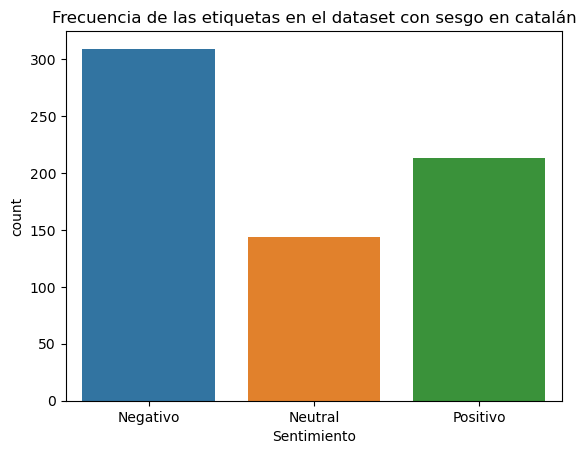

In [238]:
# gráfico de barras frecuencia de las etiquetas en el dataset en catalán
sns.countplot(x = 'Sentimiento', data = independencia_df_ca_sesgo)
plt.title('Frecuencia de las etiquetas en el dataset con sesgo en catalán')
plt.savefig('C:\\TFG\\Images\\frecuencia_etiquetas_ca_sesgo.png')

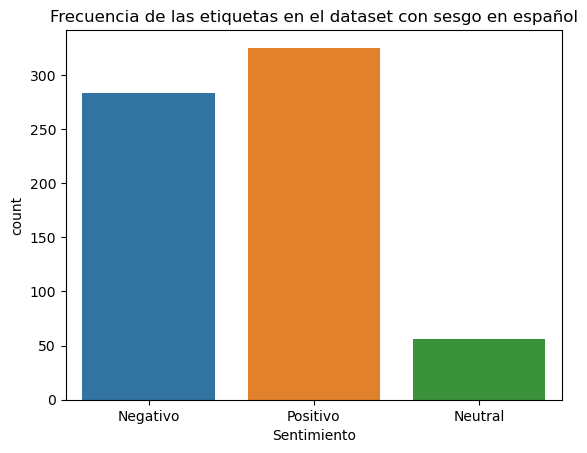

In [239]:
# gráfico de barras frecuencia de las etiquetas en el dataset en español
sns.countplot(x = 'Sentimiento', data = independencia_df_es_sesgo)
plt.title('Frecuencia de las etiquetas en el dataset con sesgo en español')
plt.savefig('C:\\TFG\\Images\\frecuencia_etiquetas_es_sesgo.png')

In [27]:
# frewcuencia de labels en la columna Sentimiento en español y catalán
print(independencia_df_es['Sentimiento'].value_counts())
print(independencia_df_ca['Sentimiento'].value_counts())

Negativo    4105
Positivo    4104
Neutral     1868
Name: Sentimiento, dtype: int64
Negativo    3988
Positivo    3902
Neutral     2158
Name: Sentimiento, dtype: int64


In [28]:
# frewcuencia de labels en la columna Sentimiento en español y catalán
print(independencia_df_es_sesgo['Sentimiento'].value_counts())
print(independencia_df_ca_sesgo['Sentimiento'].value_counts())

Positivo    325
Negativo    283
Neutral      56
Name: Sentimiento, dtype: int64
Negativo    309
Positivo    213
Neutral     144
Name: Sentimiento, dtype: int64


|Etiqueta | Frecuencia previa | Frecuencia en subset sesgado|
|---------|-------------------|-----------------------------|
|Negativo |  4105             |    283                      |
|Positivo |  4104             |    325                      |
|Neutral  |  1868             |    56                       |

En el dataset en español se observa que el sesgo de género se había redactado mayoritariamente en los tweets con sentimiento negativo y positivo, mientras que en el sentimiento neutral el sesgo se ha encontrado en menor medida. Una vez aislado el conjunto de datos con sesgo de género, se aprecia que el sentimiento hacia la independencia de Cataluña es positivo en este caso.

|Etiqueta | Frecuencia previa | Frecuencia en subset sesgado|
|---------|-------------------|-----------------------------|
|Negativo |  3988             |    309                      |
|Positivo |  3902             |    213                      |
|Neutral  |  2156             |    144                      |

En el dataset en catalán se observa que el sesgo de género, a diferencia del español, en proporción apenas tiene repercusión en el sentimiento neutral, mientras que se centra en los sentimientos negativos y positivos, pero en menor medida que en el dataset en español. Pareciera que el catalán es un idioma ligeramente más sesgado en cuanto a género que el español, pero a la vez más reticente a la independencia de Cataluña. Predomina el sentimiento negativo hacia la independencia de Cataluña.

### Vectorizer para realizar un muestreo de frecuencias y su consiguiente limpieza iterativa de palabras vacías adicionales

In [29]:
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_positivo_sesgo_es])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras por texto_sesgo_positivo
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se filtran las palabras con frecuencia menor a 5
data_dtm = data_dtm[data_dtm['frecuencia'] >= 5]
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_español
palabras = [word for word in palabras if word not in sesgo_español]
# se filtra data_dtm con las palabras que no están en sesgo_español
data_es_positivo_sesgo = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_es_positivo_sesgo.head(10)

,frecuencia,importancia
si,49,3.891820
democracia,32,3.465736
políticos,30,3.401197
catalanes,23,3.135494
antonio,23,3.135494
españa,23,3.135494
ser,20,2.995732
dice,20,2.995732
fiscal,18,2.890372
josé,18,2.890372


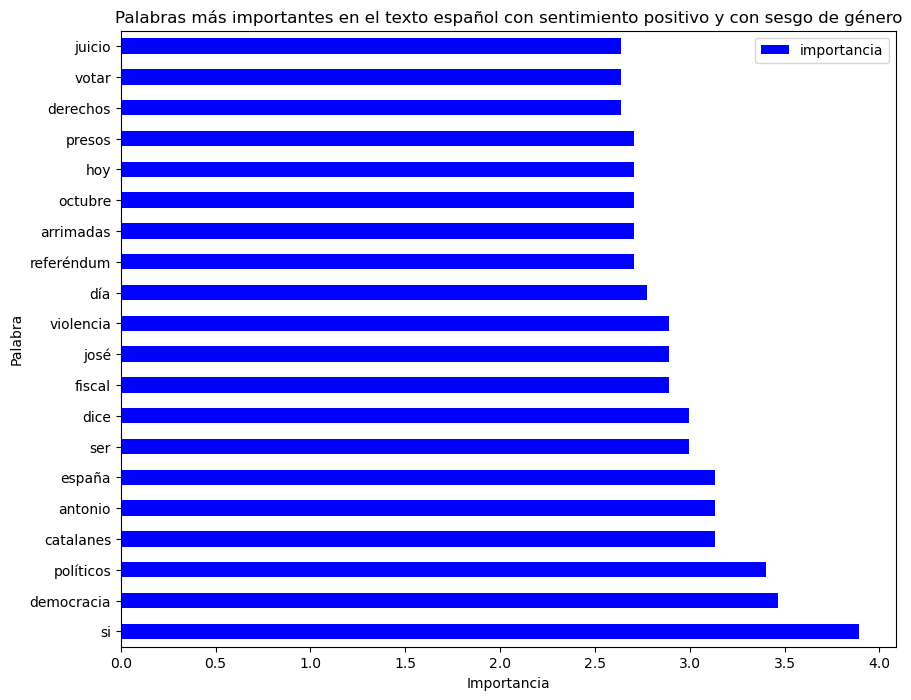

In [161]:
# crear gráfico de barras horizontal de las palabras más importantes
data_es_positivo_sesgo.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto español con sentimiento positivo y con sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_es_positivo_sesgo.png')

In [30]:
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_positivo_es])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras por texto_sesgo_positivo
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se filtran las palabras con frecuencia menor a 5
data_dtm = data_dtm[data_dtm['frecuencia'] >= 5]
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_español
palabras = [word for word in palabras if word not in sesgo_español]
# se filtra data_dtm con las palabras que no están en sesgo_español
data_es_positivo_sin_sesgo = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_es_positivo_sin_sesgo.head(10)

,frecuencia,importancia
si,596,6.390241
políticos,491,6.196444
españa,415,6.028279
democracia,407,6.008813
referéndum,240,5.480639
catalanes,236,5.463832
presos,230,5.438079
ser,226,5.420535
puigdemont,218,5.384495
independentistas,218,5.384495


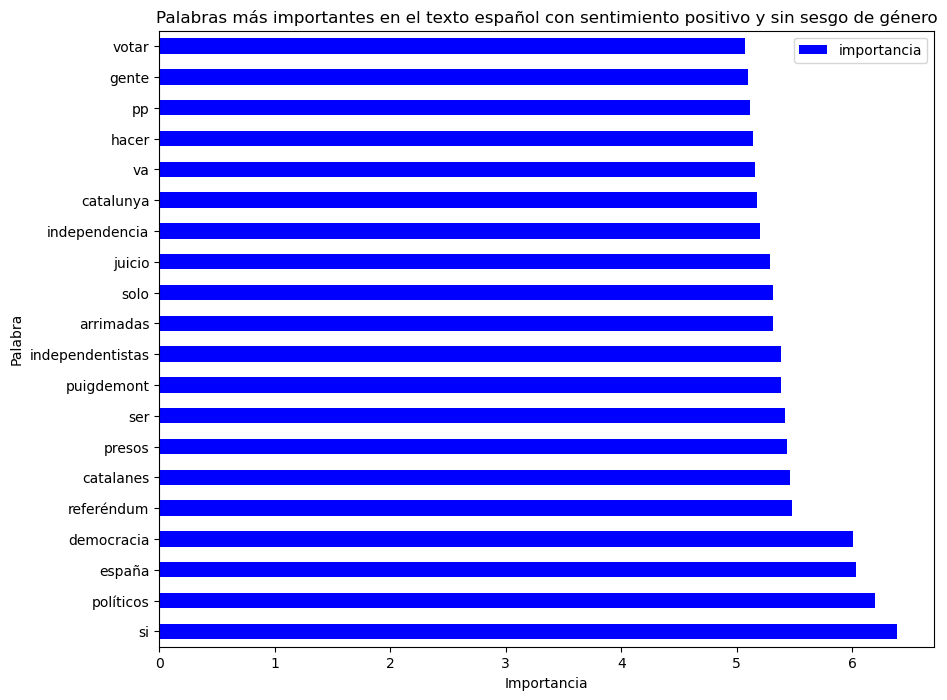

In [163]:
# crear gráfico de barras horizontal de las palabras más importantes
data_es_positivo_sin_sesgo.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto español con sentimiento positivo y sin sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_es_positivo_no_sesgo.png')

In [31]:
# frecuencia de palabras en texto_negativo_sesgo
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_negativo_sesgo_es])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras por texto_sesgo_positivo
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se filtran las palabras con frecuencia menor a 5
data_dtm = data_dtm[data_dtm['frecuencia'] >= 5]
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_español
palabras = [word for word in palabras if word not in sesgo_español]
# se filtra data_dtm con las palabras que no están en sesgo_español
data_es_negativo_sesgo = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_es_negativo_sesgo.head(10)

,frecuencia,importancia
españa,42,3.737670
políticos,36,3.583519
si,25,3.218876
cataluña,22,3.091042
ser,22,3.091042
democracia,21,3.044522
golpistas,19,2.944439
presos,18,2.890372
separatistas,18,2.890372
puigdemont,18,2.890372


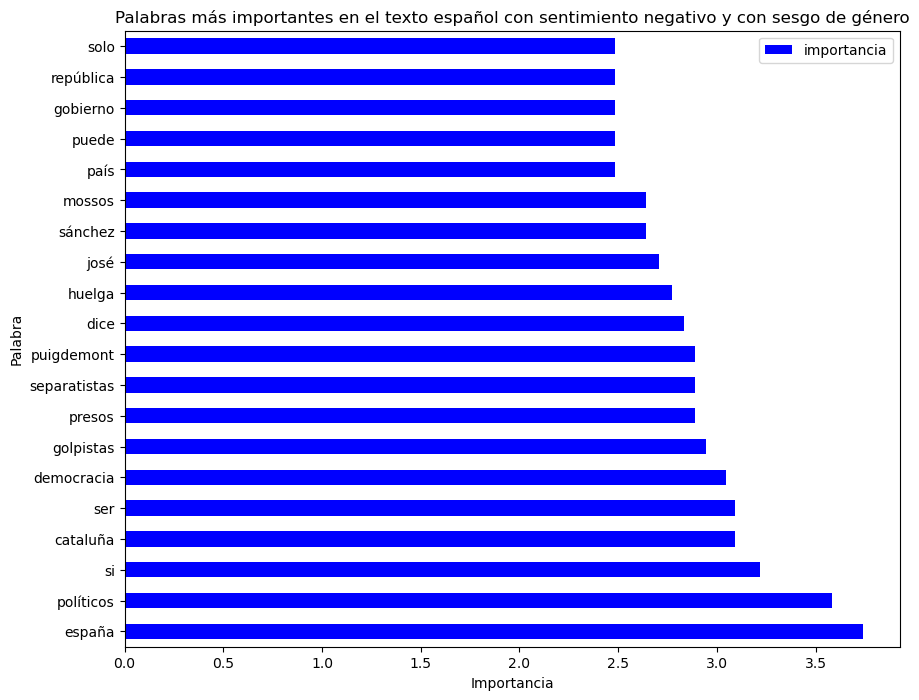

In [165]:
# crear gráfico de barras horizontal de las palabras más importantes
data_es_negativo_sesgo.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto español con sentimiento negativo y con sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_es_negativo_sesgo.png')

In [32]:
# frecuencia de palabras en texto_negativo_sesgo
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_negativo_es])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras por texto_sesgo_positivo
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se filtran las palabras con frecuencia menor a 5
data_dtm = data_dtm[data_dtm['frecuencia'] >= 5]
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_español
palabras = [word for word in palabras if word not in sesgo_español]
# se filtra data_dtm con las palabras que no están en sesgo_español
data_es_negativo_sin_sesgo = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_es_negativo_sin_sesgo.head(10)

,frecuencia,importancia
españa,579,6.361302
si,467,6.146329
cataluña,371,5.916202
políticos,338,5.823046
democracia,330,5.799093
puigdemont,305,5.720312
independentistas,302,5.710427
sánchez,288,5.662960
separatistas,262,5.568345
golpistas,258,5.552960


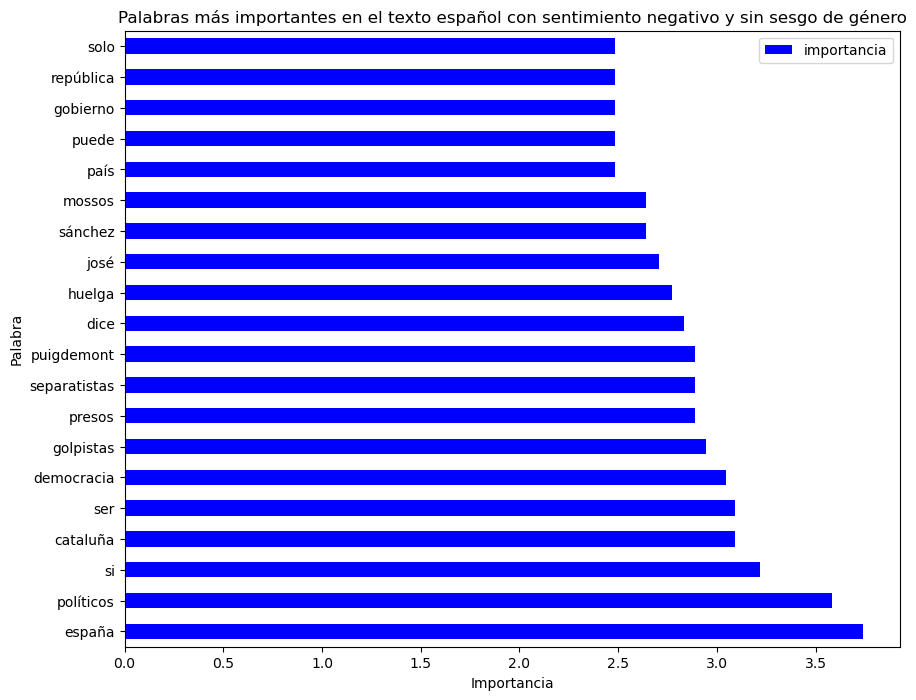

In [167]:
# crear gráfico de barras horizontal de las palabras más importantes
data_es_negativo_sesgo.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto español con sentimiento negativo y sin sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_es_negativo_no_sesgo.png')

In [33]:
# frecuencia de palabras en texto_neutral_sesgo
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_neutral_sesgo_es])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras por texto_sesgo_positivo
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_español
palabras = [word for word in palabras if word not in sesgo_español]
# se filtra data_dtm con las palabras que no están en sesgo_español
data_es_neutral_sesgo = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_es_neutral_sesgo.head(10)

,frecuencia,importancia
venezuela,5,1.609438
solo,5,1.609438
políticos,4,1.386294
menos,4,1.386294
libertad,4,1.386294
trump,4,1.386294
existe,3,1.098612
primera,3,1.098612
concierto,3,1.098612
menores,3,1.098612


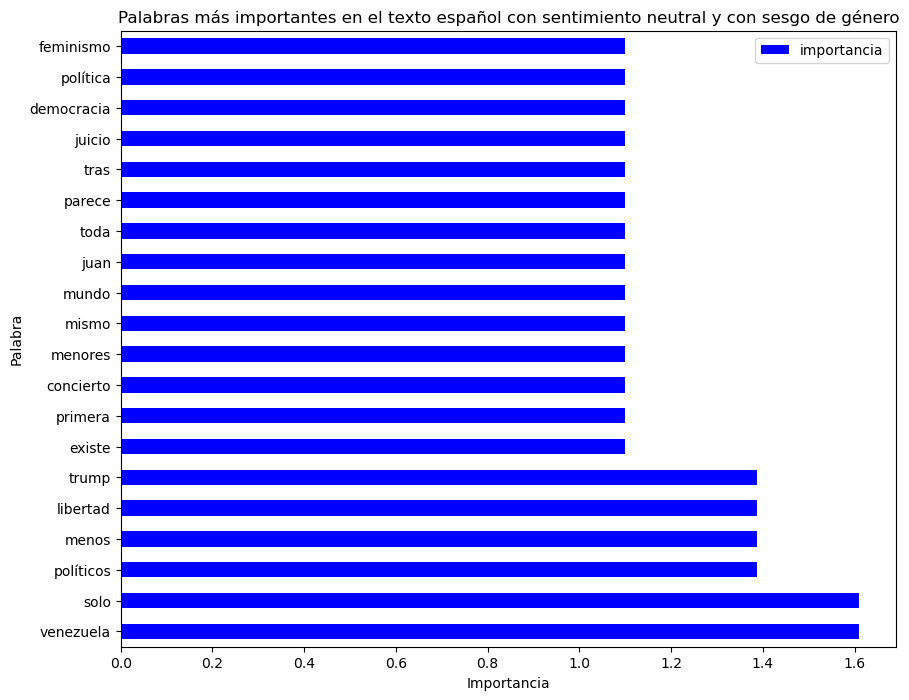

In [169]:
# crear gráfico de barras horizontal de las palabras más importantes
data_es_neutral_sesgo.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto español con sentimiento neutral y con sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_es_neutral_sesgo.png')

In [34]:
# frecuencia de palabras en texto_neutral_sesgo
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_neutral_es])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras por texto_sesgo_positivo
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_español
palabras = [word for word in palabras if word not in sesgo_español]
# se filtra data_dtm con las palabras que no están en sesgo_español
data_es_neutral_sin_sesgo = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_es_neutral_sin_sesgo.head(10)

,frecuencia,importancia
do,396,5.981414
da,311,5.739793
não,299,5.700444
um,178,5.181784
com,153,5.030438
venezuela,151,5.017280
bolsonaro,150,5.010635
na,142,4.955827
em,134,4.897840
presidente,130,4.867534


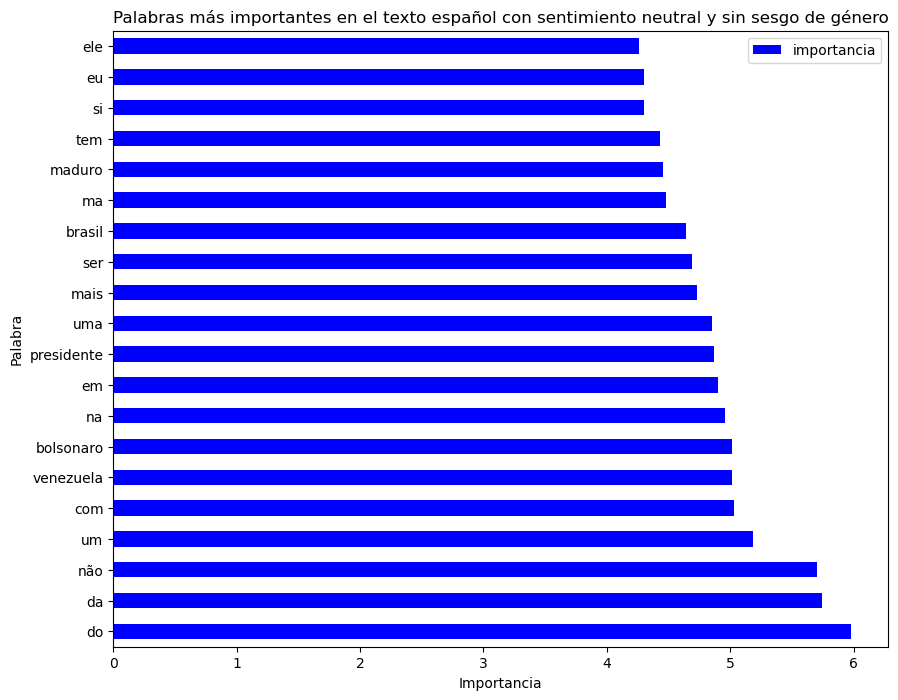

In [171]:
# crear gráfico de barras horizontal de las palabras más importantes
data_es_neutral_sin_sesgo.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto español con sentimiento neutral y sin sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_es_neutral_no_sesgo.png')

In [35]:
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_positivo_sesgo_ca])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras por texto_sesgo_positivo
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se filtran las palabras con frecuencia menor a 5
data_dtm = data_dtm[data_dtm['frecuencia'] >= 5]
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_español
palabras = [word for word in palabras if word not in sesgo_catalan]
# se filtra data_dtm con las palabras que no están en sesgo_español
data_ca_positivo_sesgo = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_ca_positivo_sesgo.head(10)

,frecuencia,importancia
votar,22,3.091042
avui,19,2.944439
dia,17,2.833213
té,17,2.833213
diu,16,2.772589
presos,16,2.772589
catalunya,15,2.708050
país,13,2.564949
polítics,13,2.564949
política,12,2.484907


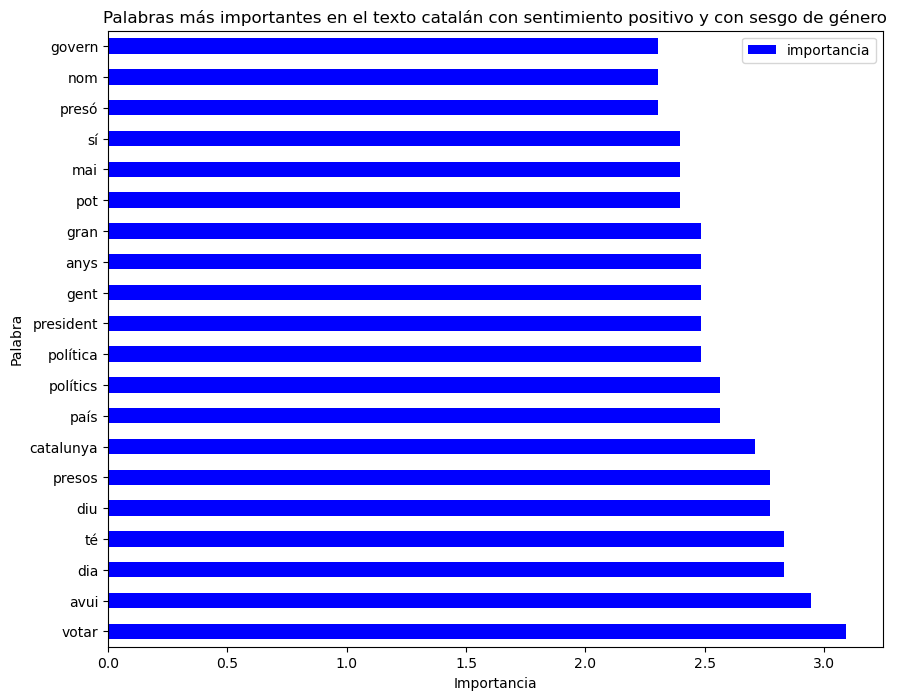

In [173]:
# crear gráfico de barras horizontal de las palabras más importantes
data_ca_positivo_sesgo.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto catalán con sentimiento positivo y con sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_ca_positivo_sesgo.png')

In [36]:
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_positivo_ca])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras por texto_sesgo_positivo
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se filtran las palabras con frecuencia menor a 5
data_dtm = data_dtm[data_dtm['frecuencia'] >= 5]
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_español
palabras = [word for word in palabras if word not in sesgo_catalan]
# se filtra data_dtm con las palabras que no están en sesgo_español
data_ca_positivo_sin_sesgo = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_ca_positivo_sin_sesgo.head(10)

,frecuencia,importancia
polítics,395,5.978886
votar,324,5.780744
catalunya,302,5.710427
presos,297,5.693732
cap,282,5.641907
govern,276,5.620401
independència,275,5.616771
puigdemont,238,5.472271
gent,232,5.446737
avui,228,5.429346


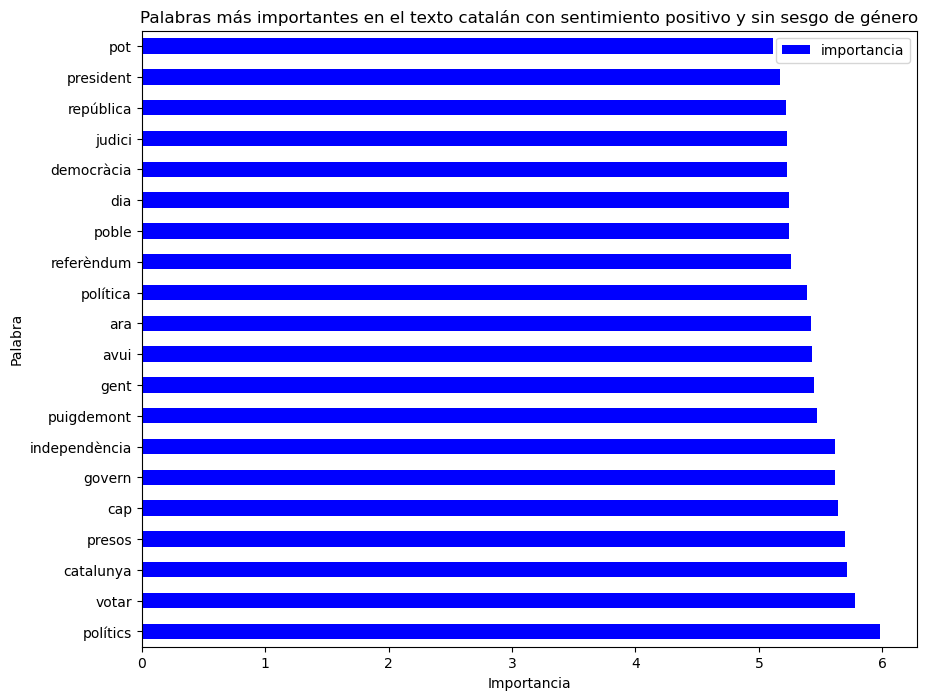

In [175]:
# crear gráfico de barras horizontal de las palabras más importantes
data_ca_positivo_sin_sesgo.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto catalán con sentimiento positivo y sin sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_ca_positivo_no_sesgo.png')

In [37]:
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_negativo_sesgo_ca])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se filtran las palabras con frecuencia menor a 5
data_dtm = data_dtm[data_dtm['frecuencia'] >= 5]
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_catalan
palabras = [word for word in palabras if word not in sesgo_catalan]
# se filtra data_dtm con las palabras que no están en sesgo_catalan
data_ca_negativo_sesgado = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_ca_negativo_sesgado.head(10)

,frecuencia,importancia
dia,29,3.367296
dir,22,3.091042
catalunya,19,2.944439
anys,18,2.890372
diu,18,2.890372
cap,18,2.890372
avui,17,2.833213
se,17,2.833213
poble,16,2.772589
tu,15,2.708050


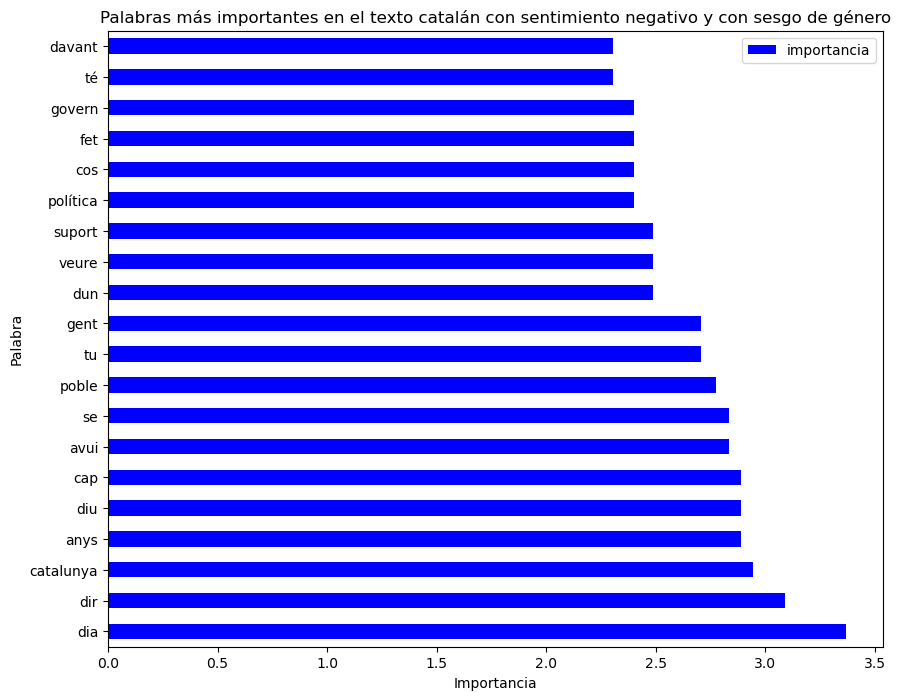

In [177]:
# crear gráfico de barras horizontal de las palabras más importantes
data_ca_negativo_sesgado.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto catalán con sentimiento negativo y con sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_ca_negativo_sesgo.png')

In [38]:
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_negativo_ca])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se filtran las palabras con frecuencia menor a 5
data_dtm = data_dtm[data_dtm['frecuencia'] >= 5]
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_catalan
palabras = [word for word in palabras if word not in sesgo_catalan]
# se filtra data_dtm con las palabras que no están en sesgo_catalan
data_ca_negativo_sin_sesgo = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_ca_negativo_sin_sesgo.head(10)

,frecuencia,importancia
catalunya,338,5.823046
gent,208,5.337538
cap,192,5.257495
govern,192,5.257495
dia,180,5.192957
ara,176,5.170484
avui,162,5.087596
dir,154,5.036953
re,154,5.036953
pot,145,4.976734


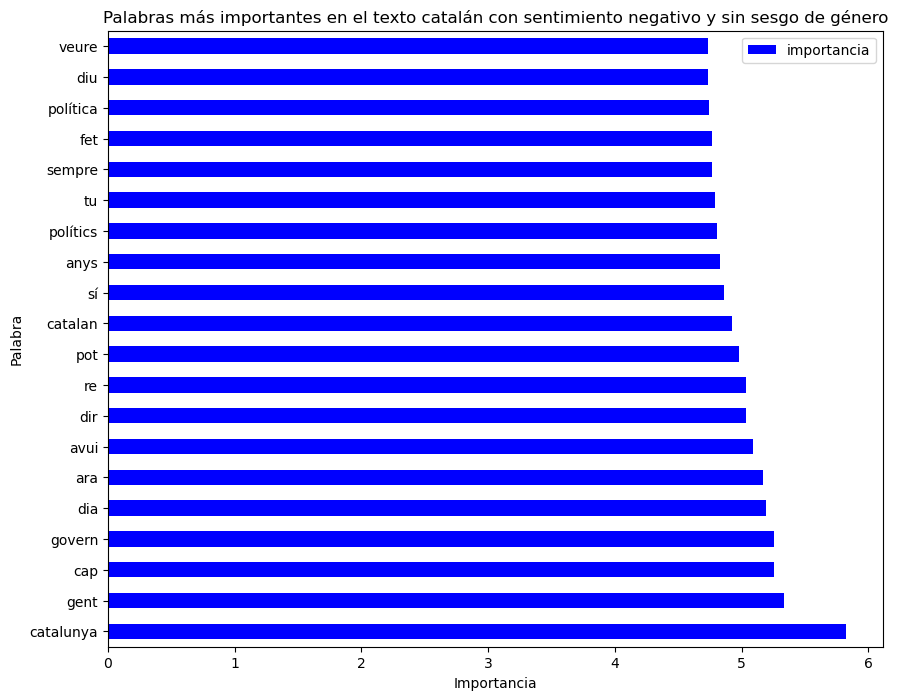

In [179]:
# crear gráfico de barras horizontal de las palabras más importantes
data_ca_negativo_sin_sesgo.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto catalán con sentimiento negativo y sin sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_ca_negativo_no_sesgo.png')

In [39]:
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_neutral_sesgo_ca])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras por texto_sesgo_neutral
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_catalan
palabras = [word for word in palabras if word not in sesgo_catalan]
# se filtra data_dtm con las palabras que no están en sesgo_catalan
data_ca_neutral_sesgado = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_ca_neutral_sesgado.head(10)

,frecuencia,importancia
segons,8,2.079442
anys,8,2.079442
millo,8,2.079442
feina,8,2.079442
política,8,2.079442
diu,8,2.079442
ara,7,1.945910
nieto,7,1.945910
gent,7,1.945910
islàmic,6,1.791759


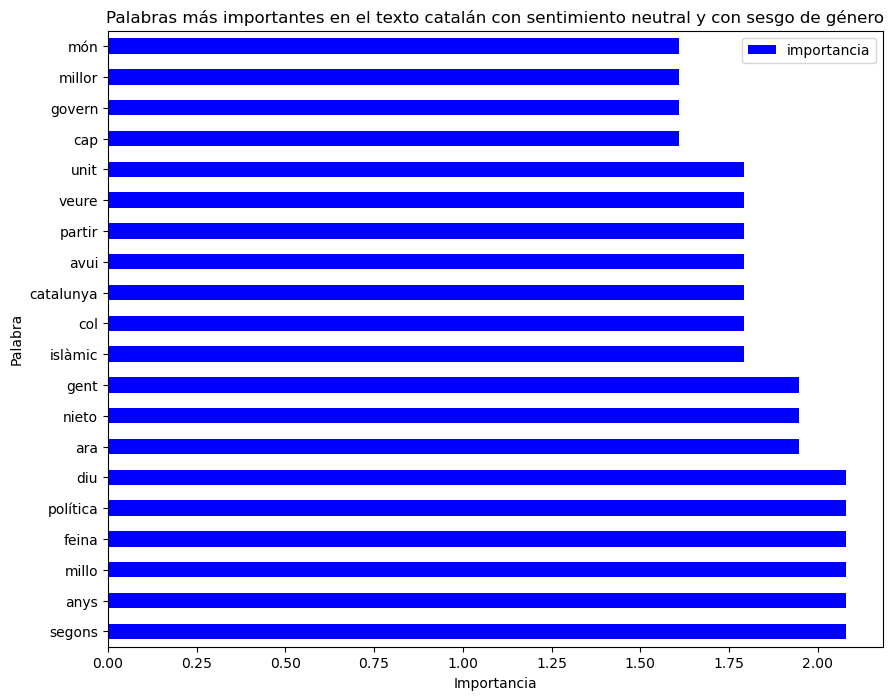

In [181]:
# crear gráfico de barras horizontal de las palabras más importantes
data_ca_neutral_sesgado.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto catalán con sentimiento neutral y con sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_ca_neutral_sesgo.png')

In [40]:
cv = CountVectorizer()
data_cv = cv.fit_transform([texto_neutral_ca])
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm = data_dtm.transpose()
data_dtm.columns = ['frecuencia']
data_dtm = data_dtm.sort_values(by='frecuencia', ascending=False)
# calcular importance de las palabras por texto_sesgo_neutral
data_dtm['importancia'] = np.log(data_dtm['frecuencia'])
data_dtm = data_dtm.sort_values(by='importancia', ascending=False)
# se extraen las palabras del índice en una lista
palabras = data_dtm.index.tolist()
# se eliminan las palabras de la lista que aparecen en sesgo_catalan
palabras = [word for word in palabras if word not in sesgo_catalan]
# se filtra data_dtm con las palabras que no están en sesgo_catalan
data_ca_neutral_sin_sesgo = data_dtm[data_dtm.index.isin(palabras)]
# se muestra el resultado
data_ca_neutral_sin_sesgo.head(10)

,frecuencia,importancia
judici,190,5.247024
cap,145,4.976734
catalunya,141,4.948760
dia,112,4.718499
procés,110,4.700480
mossos,94,4.543295
govern,93,4.532599
declaració,92,4.521789
parlament,90,4.499810
seguretat,90,4.499810


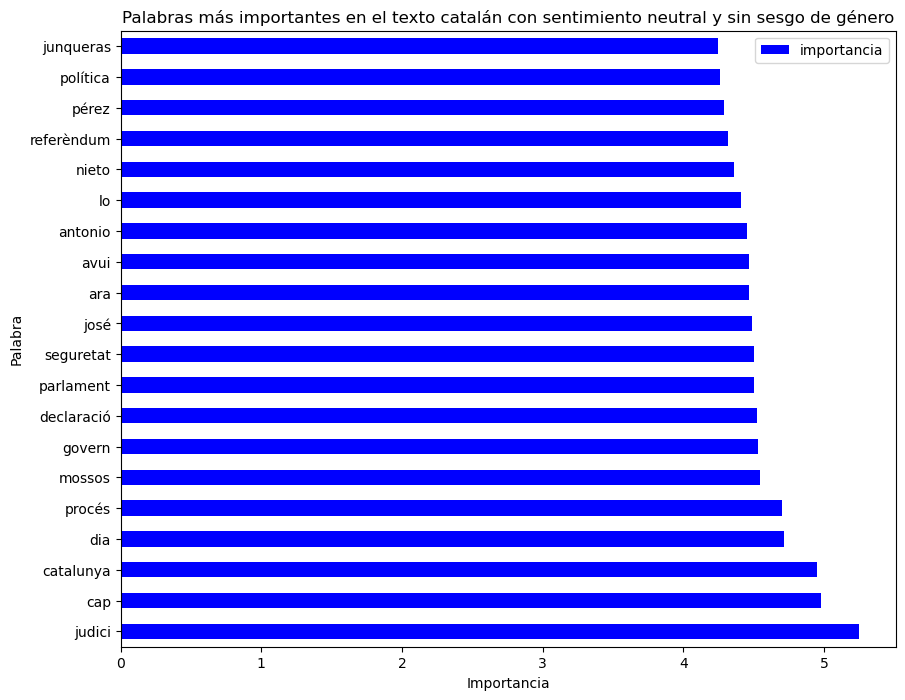

In [183]:
# crear gráfico de barras horizontal de las palabras más importantes
data_ca_neutral_sin_sesgo.head(20).plot(kind='barh', y='importancia', figsize=(10, 8), color='blue')
plt.xlabel('Importancia')
plt.ylabel('Palabra')
plt.title('Palabras más importantes en el texto catalán con sentimiento neutral y sin sesgo de género')
plt.savefig('C:\\TFG\\Images\\palabras_importantes_ca_neutral_no_sesgo.png')

Las observaciones más importantes se encuentran en que las palabras usadas en el contexto de otras palabras con sesgo de género pueden variar en función de la etiqueta de sentimiento y del mismo idioma . Al parecer, hay ciertas palabras que están asociadas directamente a un sentimiento sesgado por género; por ejemplo, aparecen más nombres como Nieto, Trump o José, además de otras palabras como fiscal, presidente y otras que pertenecen a oficios de género masculino . Por otro lado, en el caso del dataset español con sentimiento neutral sin sesgo de género, aparecen multitudes de palabras del portugués y gallego.

Por lo que se debería realizar una traducción de estos tweets al español para mejorar la precisión del modelo . En este punto cabe la posibilidad de realizar una segunda iteración sobre el proceso de transformación de datos, que contenga algún sistema Seq2Seq para realizar la traducción de los tweets en portugués y gallego al español . Esto podría mejorar la precisión del modelo y la calidad de los datos.

Entre otras mejoras, se podría generar tweets sintéticos a partir de la implementación de un stemmer como Porter que permita cambiar de género ciertas palabras, de modo que se pueda aumentar el número de instancias con tendencia hacia el sesgo de género femenino para equilibrar los datos. Por ejemplo, del stem "president" se puede generar "presidenta" o "presidentas" para aumentar la cantidad de instancias con sesgo de género femenino.

Las palabras más relevantes en general son Cataluña, España, políticos y otros términos relacionados con la política . Por lo que se debería realizar un análisis de sentimiento basado en el léxico para mejorar la precisión del modelo . En este desarrollo se han realizado modelos clásicos de análisis de sentimiento usando machine learning, pero se podría realizar un análisis de sentimiento basado en transformers y NLP para mejorar la precisión del modelo . Sin embargo, el objetivo del trabajo es realizar una comparación de los modelos, empezando por los más sencillos y avanzando hacia los más complejos.

Se mejoraría el análisis de los tweets si fuese capaz de distinguir la Comunidad Autónoma desde la que se escribe el tweet, ya que las opiniones sobre la independencia de Cataluña pueden variar en función de la Comunidad Autónoma de origen . Por lo que se podría realizar un análisis de sentimiento basado en la geolocalización de los tweets para comparar los resultados obtenidos en este trabajo con la realidad de su contexto.

En conclusión, una futura línea de acción puede ser la implementación de un modelo de análisis de sentimiento basado en transformers y NLP para mejorar la precisión del modelo . Además, se podría realizar un análisis de sentimiento basado en el léxico para mejorar la precisión del modelo . Por otro lado, se podría realizar un análisis de sentimiento basado en la traducción de los tweets en portugués y gallego al español para mejorar la precisión del modelo . Por último, se podría realizar un análisis de sentimiento basado en la generación de tweets sintéticos a partir de la implementación de un stemmer como Porter que permita cambiar de género ciertas palabras, de modo que se pueda aumentar el número de instancias con tendencia hacia el sesgo de género femenino para equilibrar los datos . La más realista sería la ampliación del producto mediante una captura de texto en un margen de tiempo, para luego analizar la evolución de los sentimientos en el tiempo.

## Modelado

Para salvaguardar la neutralidad del modelo voy a realizar un balanceo de los datos con la técnica de sobremuestreo de las clases minoritarias. Aunque se podría mantener el ligero desbalanceo donde predomina la etiqueta Negativo, voy a optar por no sesgar el modelo hacia un sentimiento en particular para evitar posicionamientos políticos.

Por otro lado, para evitar cualquier sesgo de género en el modelo, se aislan las palabras con sesgo de género y se genera una copia del dataset sin estas palabras. Aunque se podría considerar realizar un data augmentation de los tweets con sesgo de género de cualquier tipo para generar la presencia del género sesgado, se opta por eliminar estas palabras para evitar cualquier tipo de sesgo en el modelo.

In [41]:
print(independencia_df_es.value_counts('Sentimiento'))
print(independencia_df_es_sesgo.value_counts('Sentimiento'))
independencia_df_es_sin_sesgo = independencia_df_es[~independencia_df_es.index.isin(independencia_df_es_sesgo.index)]
print(independencia_df_es_sin_sesgo.value_counts('Sentimiento'))

Sentimiento
Negativo    4105
Positivo    4104
Neutral     1868
dtype: int64
Sentimiento
Positivo    325
Negativo    283
Neutral      56
dtype: int64
Sentimiento
Negativo    3529
Positivo    3478
Neutral     1670
dtype: int64


In [44]:
print(independencia_df_ca.value_counts('Sentimiento'))
print(independencia_df_ca_sesgo.value_counts('Sentimiento'))
independencia_df_ca_sin_sesgo = independencia_df_ca[~independencia_df_ca.index.isin(independencia_df_ca_sesgo.index)]
print(independencia_df_ca_sin_sesgo.value_counts('Sentimiento'))

Sentimiento
Negativo    3988
Positivo    3902
Neutral     2158
dtype: int64
Sentimiento
Negativo    309
Positivo    213
Neutral     144
dtype: int64
Sentimiento
Negativo    3406
Positivo    3404
Neutral     1857
dtype: int64


In [45]:
# 1500 instancias aleatorias de clase Negativo
independencia_df_es_negativo = independencia_df_es_sin_sesgo[independencia_df_es_sin_sesgo['Sentimiento'] == 'Negativo'].sample(1670)
# 1500 instancias aleatorias de clase Positivo
independencia_df_es_positivo = independencia_df_es_sin_sesgo[independencia_df_es_sin_sesgo['Sentimiento'] == 'Positivo'].sample(1670)
# 1868 instancias aleatorias de clase Neutral
independencia_df_es_neutral = independencia_df_es_sin_sesgo[independencia_df_es_sin_sesgo['Sentimiento'] == 'Neutral'].sample(1670)
# concatenar los subconjuntos
independencia_df_es_balanced = pd.concat([independencia_df_es_negativo, independencia_df_es_positivo, independencia_df_es_neutral])
# se mezclan las instancias
independencia_df_es_balanced = independencia_df_es_balanced.sample(frac=1)
# se muestra el resultado
independencia_df_es_balanced['Sentimiento'].value_counts()

Neutral     1670
Positivo    1670
Negativo    1670
Name: Sentimiento, dtype: int64

In [46]:
# 1500 instancias aleatorias de clase Negativo
independencia_df_ca_negativo = independencia_df_ca_sin_sesgo[independencia_df_ca_sin_sesgo['Sentimiento'] == 'Negativo'].sample(1857)
# 1500 instancias aleatorias de clase Positivo
independencia_df_ca_positivo = independencia_df_ca_sin_sesgo[independencia_df_ca_sin_sesgo['Sentimiento'] == 'Positivo'].sample(1857)
# 1868 instancias aleatorias de clase Neutral
independencia_df_ca_neutral = independencia_df_ca_sin_sesgo[independencia_df_ca_sin_sesgo['Sentimiento'] == 'Neutral'].sample(1857)
# concatenar los subconjuntos
independencia_df_ca_balanced = pd.concat([independencia_df_ca_negativo, independencia_df_ca_positivo, independencia_df_ca_neutral])
# se mezclan las instancias
independencia_df_ca_balanced = independencia_df_ca_balanced.sample(frac=1)
# se muestra el resultado
independencia_df_ca_balanced['Sentimiento'].value_counts()

Positivo    1857
Negativo    1857
Neutral     1857
Name: Sentimiento, dtype: int64

In [47]:
df_positivo_es = independencia_df_es_balanced[independencia_df_es_balanced['Sentimiento'] == 'Positivo']
df_negativo_es = independencia_df_es_balanced[independencia_df_es_balanced['Sentimiento'] == 'Negativo']
df_neutral_es = independencia_df_es_balanced[independencia_df_es_balanced['Sentimiento'] == 'Neutral']
df_positivo_ca = independencia_df_ca_balanced[independencia_df_ca_balanced['Sentimiento'] == 'Positivo']
df_negativo_ca = independencia_df_ca_balanced[independencia_df_ca_balanced['Sentimiento'] == 'Negativo']
df_neutral_ca = independencia_df_ca_balanced[independencia_df_ca_balanced['Sentimiento'] == 'Neutral']

In [53]:
# se guardan los datasets en archivos csv
independencia_df_ca.to_csv('C:\TFG\DataProcessed\independencia_df_ca.csv', index=False)
independencia_df_es.to_csv('C:\TFG\DataProcessed\independencia_df_es.csv', index=False)
independencia_df_ca_sesgo.to_csv('C:\TFG\DataProcessed\independencia_df_ca_sesgo.csv', index=False)
independencia_df_es_sesgo.to_csv('C:\TFG\DataProcessed\independencia_df_es_sesgo.csv', index=False)
independencia_df_ca_sin_sesgo.to_csv('C:\TFG\DataProcessed\independencia_df_ca_sin_sesgo.csv', index=False)
independencia_df_es_sin_sesgo.to_csv('C:\TFG\DataProcessed\independencia_df_es_sin_sesgo.csv', index=False)
independencia_df_ca_balanced.to_csv('C:\TFG\DataProcessed\independencia_df_ca_balanced.csv', index=False)
independencia_df_es_balanced.to_csv('C:\TFG\DataProcessed\independencia_df_es_balanced.csv', index=False)

### Clasificador Naive Bayes Multinomial

In [36]:
# cargar independencia_df_es_balanced

independencia_df_es_balanced = pd.read_csv('C:\TFG\DataProcessed\independencia_df_es_balanced.csv')
independencia_df_ca_balanced = pd.read_csv('C:\TFG\DataProcessed\independencia_df_ca_balanced.csv')

In [39]:
textos_es = independencia_df_es_balanced['Texto_preprocesado'].apply(lambda x: ''.join(x))
labels_es = independencia_df_es_balanced['Sentimiento']
encoder_es = LabelEncoder()
etiquetas_es_encoded = encoder_es.fit_transform(labels_es)
# crear conjunto de train, test y valid en español
train_sentences_es, test_sentences_es, train_labels_es, test_labels_es = train_test_split(textos_es, etiquetas_es_encoded, test_size = 0.2, random_state = 1335)
# crear conjunto de validación
test_sentences_es, valid_sentences_es, test_labels_es, valid_labels_es = train_test_split(test_sentences_es, test_labels_es, test_size = 0.25, random_state = 1335)


In [31]:
# modelo naive bayes multinomial con 3 clases
time_start = time.time()
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer()),
    ('classifier', MultinomialNB())
])

param_grid = {
    'vectorizer__ngram_range': [(1, 1), (1, 2), (1, 3)],
    'classifier__alpha': np.linspace(0.1, 1, 10),
    'classifier__fit_prior': [True, False],
    'classifier__class_prior': [None, [0.33, 0.33, 0.33]]
    }

grid_nb_es = GridSearchCV(pipeline, param_grid, cv=3)
grid_nb_es.fit(train_sentences_es, train_labels_es)
print(grid_nb_es.best_params_)
print(grid_nb_es.best_score_)
print(grid_nb_es.score(test_sentences_es, test_labels_es))

# Hacer predicciones
predicciones = grid_nb_es.predict(test_sentences_es)

# Print métricas de rendimiento
print(classification_report(test_labels_es, predicciones))
nb_es_acc = accuracy_score(test_labels_es, predicciones)
nb_es_rec = recall_score(test_labels_es, predicciones, average='weighted')
nb_es_prec = precision_score(test_labels_es, predicciones, average='weighted')
nb_es_f1 = f1_score(test_labels_es, predicciones, average='weighted')
time_finish = time.time()
nb_es_time = time_finish - time_start

{'classifier__alpha': 1.0, 'classifier__class_prior': None, 'classifier__fit_prior': False, 'vectorizer__ngram_range': (1, 3)}
0.6474550898203594
0.6706586826347305
              precision    recall  f1-score   support

           0       0.58      0.68      0.62       337
           1       0.94      0.66      0.78       345
           2       0.59      0.68      0.63       320

    accuracy                           0.67      1002
   macro avg       0.70      0.67      0.68      1002
weighted avg       0.71      0.67      0.68      1002



In [48]:
nb_es = Pipeline([('tfidf', TfidfVectorizer(ngram_range=(1, 3))),('clf', MultinomialNB(alpha=0.1, fit_prior=True, class_prior=None)),])
# transform the text data into numerical features
nb_es.fit(train_sentences_es, train_labels_es)

Pipeline(steps=[('tfidf', TfidfVectorizer(ngram_range=(1, 3))),
                ('clf', MultinomialNB(alpha=0.1))])

In [ ]:
def predict_text_with_score(model, text):
    """
    Predict the class of the given text using the trained model and provide the probability scores.

    :param model: The trained text classification model (pipeline).
    :param text: A string containing the text to be classified.
    :return: The predicted class of the text and the probability scores.
    """
    prediction = model.predict([text])
    prediction_proba = model.predict_proba([text])

    # Getting the class labels
    class_labels = model.classes_

    # Formatting the probability scores along with the class labels
    proba_scores = {class_labels[i]: prediction_proba[0][i] for i in range(len(class_labels))}

    return prediction[0], proba_scores

# Example usage
your_text = "Arrimadas podría anunciar su salto a la política nacional hoy mismo"
predicted_class, scores = predict_text_with_score(nb_es, your_text)
print("Predicted class:", predicted_class)
print("Probability Scores:", scores)

In [ ]:
import joblib
joblib.dump(nb_es, 'C:\\TFG\\Models\\naivebayes_es.joblib')

In [49]:
# guardar el modelo NaiveBayes en formato pickle
import pickle 
with open('C:\\TFG\\Models\\naivebayes_es.pickle', 'wb') as dump_var:
    pickle.dump(nb_es, dump_var)


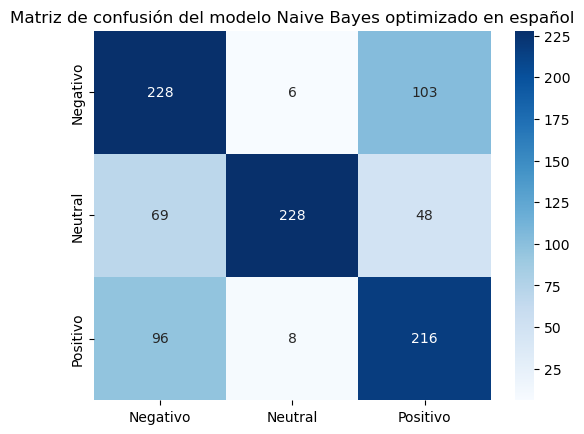

In [50]:
# crear un mapa de calor con la matriz de confusión
conf_matrix_nb_es = confusion_matrix(test_labels_es, predicciones)
sns.heatmap(conf_matrix_nb_es, annot=True, fmt='d', cmap='Blues', xticklabels=encoder_es.classes_, yticklabels=encoder_es.classes_)
plt.title('Matriz de confusión del modelo Naive Bayes optimizado en español')
plt.savefig('C:\\TFG\\Models\\confusion_matrix_nb_es.png')

In [51]:
textos_ca = independencia_df_ca_balanced['Texto_preprocesado'].apply(lambda x: ''.join(x))
labels_ca = independencia_df_ca_balanced['Sentimiento']
encoder = LabelEncoder()
etiquetas_ca_encoded = encoder.fit_transform(labels_ca)
# crear conjunto de train, test y valid
train_sentences_ca, test_sentences_ca, train_labels_ca, test_labels_ca = train_test_split(textos_ca, etiquetas_ca_encoded, stratify = etiquetas_ca_encoded, test_size = 0.2, random_state = 1335)
# crear conjunto de validación
test_sentences_ca, val_sentences_ca, test_labels_ca, val_labels_ca = train_test_split(test_sentences_ca, test_labels_ca, stratify = test_labels_ca, test_size = 0.25, random_state = 1335)


In [53]:
time_start = time.time()
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer()),
    ('classifier', MultinomialNB())
])

param_grid = {
    'vectorizer__ngram_range': [(1, 1), (1, 2), (1, 3)],
    'classifier__alpha': np.linspace(0.1, 1, 10),
    'classifier__fit_prior': [True, False],
    'classifier__class_prior': [None, [0.33, 0.33, 0.33]]
}

grid_nb_ca = GridSearchCV(pipeline, param_grid, cv=3)
grid_nb_ca.fit(train_sentences_ca, train_labels_ca)
print(grid_nb_ca.best_params_)
print(grid_nb_ca.best_score_)
print(grid_nb_ca.score(test_sentences_ca, test_labels_ca))
predicciones = grid_nb_ca.predict(test_sentences_ca)
print(classification_report(test_labels_ca, predicciones))
nb_ca_acc = accuracy_score(test_labels_ca, predicciones)
nb_ca_rec = recall_score(test_labels_ca, predicciones, average='weighted')
nb_ca_pre = precision_score(test_labels_ca, predicciones, average='weighted')
nb_ca_f1 = f1_score(test_labels_ca, predicciones, average='weighted')
time_finish = time.time()
nb_ca_time = time_finish - time_start


{'classifier__alpha': 1.0, 'classifier__class_prior': None, 'classifier__fit_prior': False, 'vectorizer__ngram_range': (1, 3)}
0.5684491090054123
0.5933014354066986
              precision    recall  f1-score   support

           0       0.58      0.39      0.47       279
           1       0.68      0.67      0.67       278
           2       0.54      0.72      0.61       279

    accuracy                           0.59       836
   macro avg       0.60      0.59      0.59       836
weighted avg       0.60      0.59      0.59       836



In [54]:
nb_ca = Pipeline([('tfidf', TfidfVectorizer(ngram_range=(1, 3))),('clf', MultinomialNB(alpha=0.7, fit_prior=True, class_prior=None)),])
# transform the text data into numerical features
nb_ca.fit(train_sentences_ca, train_labels_ca)

Pipeline(steps=[('tfidf', TfidfVectorizer(ngram_range=(1, 3))),
                ('clf', MultinomialNB(alpha=0.7))])

In [55]:
def predict_text_with_score(model, text):
    """
    Predict the class of the given text using the trained model and provide the probability scores.

    :param model: The trained text classification model (pipeline).
    :param text: A string containing the text to be classified.
    :return: The predicted class of the text and the probability scores.
    """
    prediction = model.predict([text])
    prediction_proba = model.predict_proba([text])

    # Getting the class labels
    class_labels = model.classes_

    # Formatting the probability scores along with the class labels
    proba_scores = {class_labels[i]: prediction_proba[0][i] for i in range(len(class_labels))}

    return prediction[0], proba_scores

# Example usage
your_text = "AUDIO Pérez de los Cobos el coordinador de loperatiu policial repressor de l1O admet en declaració que es va utilitzar la força en la gran majoria de centres electorals Un altre que disitjo que en un futur sassegui a tribunals internacionals"
predicted_class, scores = predict_text_with_score(nb_ca, your_text)
print("Predicted class:", predicted_class)
print("Probability Scores:", scores)

Predicted class: 1
Probability Scores: {0: 0.11509618915570909, 1: 0.7574272575618995, 2: 0.12747655328239205}


In [56]:
# guardar el modelo NaiveBayes en formato pickle
import pickle 
with open('C:\\TFG\\Models\\naivebayes_ca.pickle', 'wb') as dump_var:
    pickle.dump(nb_ca, dump_var)

In [57]:
import joblib
joblib.dump(nb_ca, 'C:\\TFG\\Models\\naivebayes_ca.joblib')

['C:\\TFG\\Models\\naivebayes_ca.joblib']

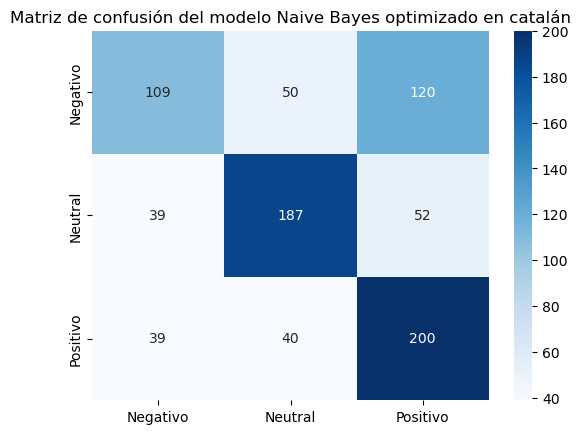

In [58]:
# crear un mapa de calor con la matriz de confusión
conf_matrix_nb_ca = confusion_matrix(test_labels_ca, predicciones)
sns.heatmap(conf_matrix_nb_ca, annot=True, fmt='d', cmap='Blues', xticklabels=encoder_es.classes_, yticklabels=encoder_es.classes_)
plt.title('Matriz de confusión del modelo Naive Bayes optimizado en catalán')
plt.savefig('C:\\TFG\\Models\\confusion_matrix_nb_ca.png')

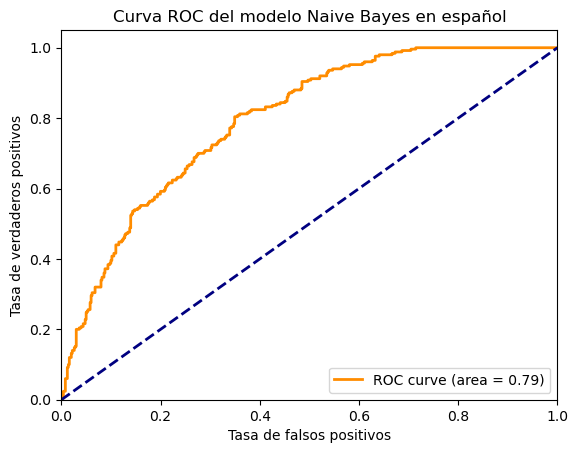

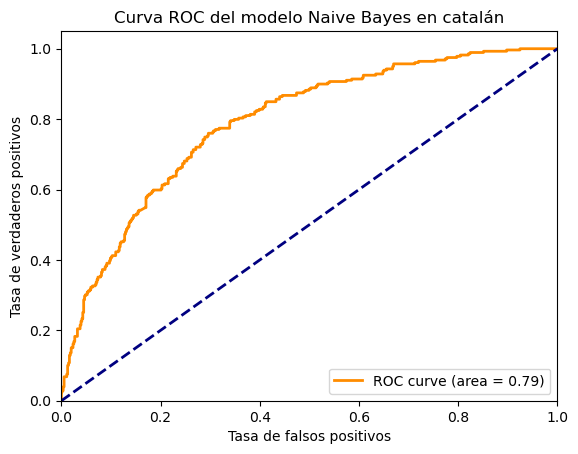

In [ ]:
# se binarizan las etiquetas
test_labels_es_bin = label_binarize(test_labels_es, classes=[0, 1, 2])
test_labels_ca_bin = label_binarize(test_labels_ca, classes=[0, 1, 2])

# se calculan las probabilidades de las predicciones
predicciones_es = grid_nb_es.predict_proba(test_sentences_es)
predicciones_ca = grid_nb_ca.predict_proba(test_sentences_ca)

# se calculan las curvas roc
fpr_es = dict()
tpr_es = dict()
roc_auc_es = dict()
fpr_ca = dict()
tpr_ca = dict()
roc_auc_ca = dict()
for i in range(3):
    fpr_es[i], tpr_es[i], _ = roc_curve(test_labels_es_bin[:, i], predicciones_es[:, i])
    roc_auc_es[i] = auc(fpr_es[i], tpr_es[i])
    fpr_ca[i], tpr_ca[i], _ = roc_curve(test_labels_ca_bin[:, i], predicciones_ca[:, i])
    roc_auc_ca[i] = auc(fpr_ca[i], tpr_ca[i])
    
# se grafican las curvas roc
plt.figure()
lw = 2
plt.plot(fpr_es[0], tpr_es[0], color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc_es[0])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva ROC del modelo Naive Bayes en español')
plt.legend(loc="lower right")
plt.savefig('C:\\TFG\\Models\\roc_nb_es.png')
plt.figure()
lw = 2
plt.plot(fpr_ca[0], tpr_ca[0], color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc_ca[0])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva ROC del modelo Naive Bayes en catalán')
plt.legend(loc="lower right")
plt.savefig('C:\\TFG\\Models\\roc_nb_ca.png')

Ahora, se profundiza aún más en los vectores de palabras y se realiza un análisis de las palabras más relevantes en cada uno de los segmentos de datos resultantes. Se observa que las palabras más relevantes en los tweets, sin diferenciar el sentimiento, se agrupan únicamente por idioma

In [ ]:
def format_sentence(sent):
    '''
    la funcion format_sentence recibe una oración y la convierte en un diccionario de palabras
    parametros:
    -sent: oración
    retorna:
    -diccionario de palabras tokenizadas
    '''
    return({word: True for word in nltk.word_tokenize(sent)})


In [ ]:
pos_es = []
neg_es = []
neu_es = []
# se aplica la función a cada serie
for tweet in df_positivo_es['Texto_preprocesado']:
    pos_es.append((format_sentence(str(tweet)), 'Positivo'))
for tweet in df_negativo_es['Texto_preprocesado']:
    neg_es.append((format_sentence(str(tweet)), 'Negativo'))
for tweet in df_negativo_es['Texto_preprocesado']:
    neu_es.append((format_sentence(str(tweet)), 'Neutral'))


In [ ]:
# se aplica la función format_sentence al dataset en catalán
pos_ca = []
neg_ca = []
neu_ca = []
for tweet in df_positivo_ca['Texto_preprocesado']:
    pos_ca.append((format_sentence(str(tweet)), 'Positivo'))
for tweet in df_negativo_ca['Texto_preprocesado']:
    neg_ca.append((format_sentence(str(tweet)), 'Negativo'))
for tweet in df_neutral_ca['Texto_preprocesado']:
    neu_ca.append((format_sentence(str(tweet)), 'Neutral'))


In [ ]:
# se dividen los datos en conjuntos de entrenamiento y prueba
training_es = pos_es[:int((.9)*len(pos_es))] + neg_es[:int((.9)*len(neg_es))] + neu_es[:int((.9)*len(neu_es))]
test_es = pos_es[int((.1)*len(pos_es)):] + neg_es[int((.1)*len(neg_es)):]+ neu_es[int((.1)*len(neu_es)):]

In [ ]:
# se dividen los datos en conjuntos de entrenamiento y prueba
training_ca = pos_ca[:int((.9)*len(pos_ca))] + neg_ca[:int((.9)*len(neg_ca))] + neu_ca[:int((.9)*len(neu_ca))]
test_ca = pos_ca[int((.1)*len(pos_ca)):] + neg_ca[int((.1)*len(neg_ca)):] + neu_ca[int((.1)*len(neu_ca)):]

In [ ]:
classifier_es = NaiveBayesClassifier.train(training_es)
classifier_es.show_most_informative_features()

Most Informative Features
            'separatista = True           Negati : Positi =      9.7 : 1.0
                     'és = True           Positi : Neutra =      9.0 : 1.0
            'separatismo = True           Negati : Positi =      9.0 : 1.0
                  'rajoy = True           Positi : Neutra =      8.1 : 1.0
           'separatistas = True           Negati : Positi =      7.5 : 1.0
              'catalanas = True           Negati : Positi =      7.0 : 1.0
               'corrupto = True           Positi : Neutra =      7.0 : 1.0
               'empresas = True           Negati : Positi =      7.0 : 1.0
                 'figura = True           Negati : Positi =      7.0 : 1.0
               'mediador = True           Negati : Positi =      7.0 : 1.0


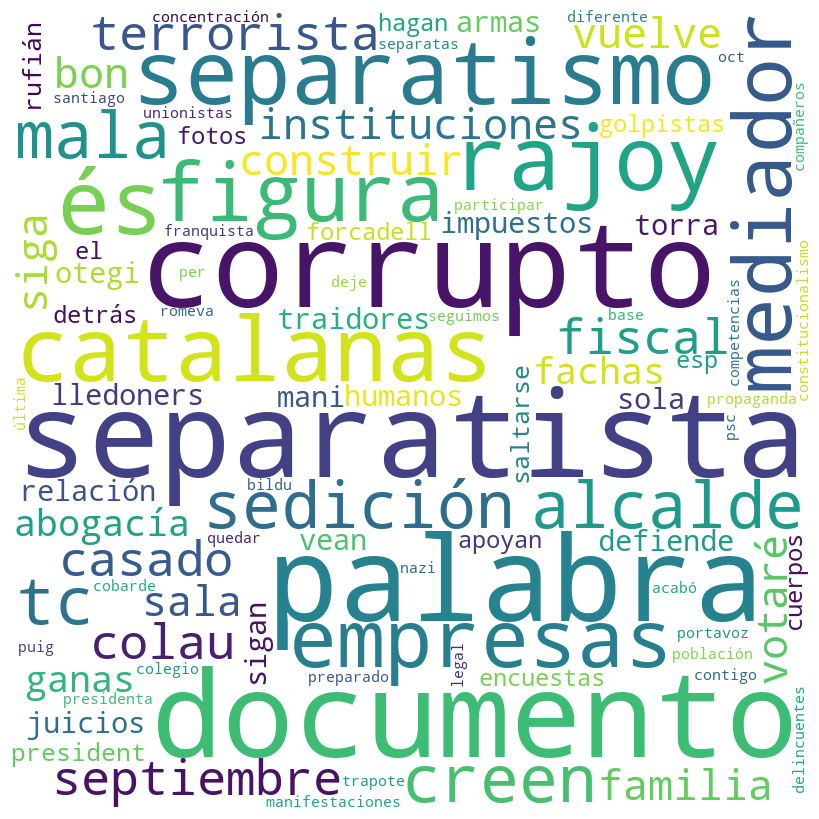

In [ ]:
# se extraen las palabras más informativas
word_features = classifier_es.most_informative_features()
# se crea una nube de palabras
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = None, 
                min_font_size = 10).generate(' '.join([word for word, value in word_features]))

# mostrar la nube de palabras
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.savefig('C:\\TFG\\Models\\wordcloud_most_relevant_words_nb_es.png')

In [ ]:
classifier_ca = NaiveBayesClassifier.train(training_ca)
classifier_ca.show_most_informative_features()

Most Informative Features
                   'josé = True           Neutra : Negati =     48.3 : 1.0
            'exsecretari = True           Neutra : Positi =     33.0 : 1.0
                  'diego = True           Neutra : Negati =     27.7 : 1.0
                  'pérez = True           Neutra : Negati =     23.8 : 1.0
                'indepes = True           Negati : Neutra =     21.7 : 1.0
                 'romeva = True           Neutra : Negati =     15.4 : 1.0
                  'minut = True           Neutra : Positi =     14.3 : 1.0
              'castellví = True           Neutra : Positi =     13.7 : 1.0
                  'manel = True           Neutra : Negati =     13.7 : 1.0
                  'nieto = True           Neutra : Negati =     13.4 : 1.0


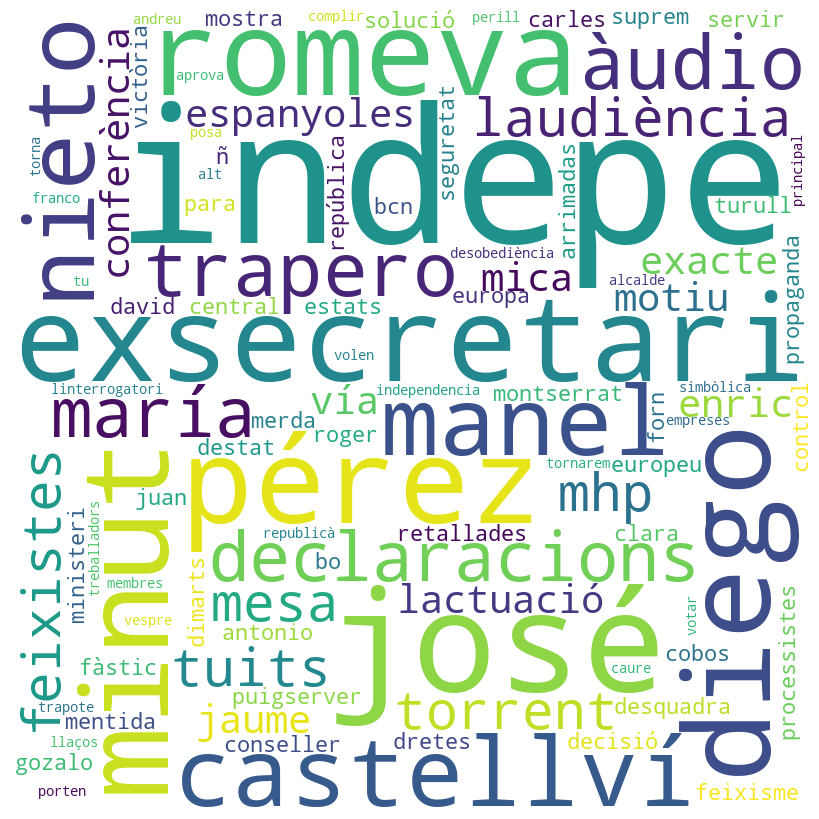

In [ ]:
# mostrar nube de palabras con las palabras más informativas del catalán
word_features = classifier_ca.most_informative_features()
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = None, 
                min_font_size = 10).generate(' '.join([word for word, value in word_features]))

# mostrar la nube de palabras
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.savefig('C:\\TFG\\Models\\wordcloud_most_relevant_words_nb_ca.png')

### SVM

In [59]:
textos_es = independencia_df_es_balanced['Texto_preprocesado'].apply(lambda x: ''.join(x))
labels_es = independencia_df_es_balanced['Sentimiento']
encoder_es = LabelEncoder()
etiquetas_es_encoded = encoder_es.fit_transform(labels_es)
# crear conjunto de train, test y valid en español
train_sentences_es, test_sentences_es, train_labels_es, test_labels_es = train_test_split(textos_es, etiquetas_es_encoded, stratify = etiquetas_es_encoded, test_size = 0.2, random_state = 1335)
# crear conjunto de validación
test_sentences_es, valid_sentences_es, test_labels_es, valid_labels_es = train_test_split(test_sentences_es, test_labels_es, stratify = test_labels_es, test_size = 0.25, random_state = 1335)


In [60]:
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer()),
    ('classifier', SVC(random_state=1335))
])

param_grid = {
    'vectorizer__ngram_range': [(1, 1), (1, 2), (1, 3)],
    'classifier__C': [0.1, 1],
    'classifier__gamma': [1, 0.1, 0.01],
    'classifier__kernel': ['rbf', 'poly', 'sigmoid']
}

svm_es_grid = GridSearchCV(pipeline, param_grid, cv=3)
svm_es_grid.fit(train_sentences_es, train_labels_es)
print(svm_es_grid.best_params_)
print(svm_es_grid.best_score_)
print(svm_es_grid.score(test_sentences_es, test_labels_es))
predicciones_svm_es = svm_es_grid.predict(test_sentences_es)
print(classification_report(test_labels_es, predicciones_svm_es))
svm_es_acc = accuracy_score(test_labels_es, predicciones_svm_es)
svm_es_rec = recall_score(test_labels_es, predicciones_svm_es, average='weighted')
svm_es_prec = precision_score(test_labels_es, predicciones_svm_es, average='weighted')
svm_es_f1 = f1_score(test_labels_es, predicciones_svm_es, average='weighted')
time_finish = time.time()
svm_es_time = time_finish - time_start


{'classifier__C': 1, 'classifier__gamma': 1, 'classifier__kernel': 'rbf', 'vectorizer__ngram_range': (1, 1)}
0.655439121756487
0.6897470039946738
              precision    recall  f1-score   support

           0       0.64      0.63      0.64       250
           1       0.94      0.73      0.82       251
           2       0.57      0.71      0.64       250

    accuracy                           0.69       751
   macro avg       0.72      0.69      0.70       751
weighted avg       0.72      0.69      0.70       751



In [61]:
svm_es = Pipeline([('tfidf', TfidfVectorizer(ngram_range=(1, 1))),('clf', SVC(C=1, gamma=1, kernel='rbf', random_state=1335)),])
# transform the text data into numerical features
svm_es.fit(train_sentences_ca, train_labels_ca)

Pipeline(steps=[('tfidf', TfidfVectorizer()),
                ('clf', SVC(C=1, gamma=1, random_state=1335))])

In [62]:
# guardar el modelo SVM en formato pickle
with open('C:\\TFG\\Models\\svm_es.pickle', 'wb') as dump_var:
    pickle.dump(svm_es, dump_var)

In [63]:
import joblib
joblib.dump(svm_es, 'C:\\TFG\\Models\\svm_es.joblib')

['C:\\TFG\\Models\\svm_es.joblib']

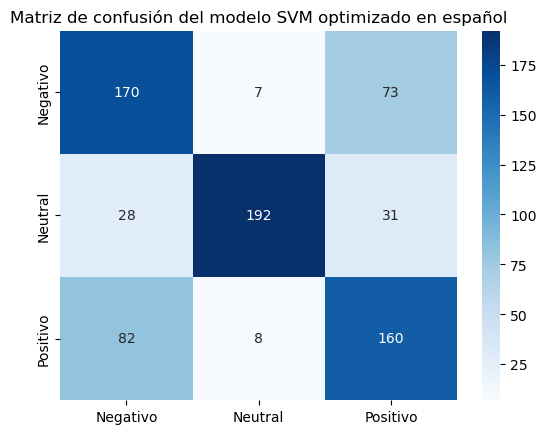

In [ ]:
# crear un mapa de calor con la matriz de confusión
conf_matrix_svm_es = confusion_matrix(test_labels_es, predicciones_svm_es)
sns.heatmap(conf_matrix_svm_es, annot=True, fmt='d', cmap='Blues', xticklabels=encoder_es.classes_, yticklabels=encoder_es.classes_)
plt.title('Matriz de confusión del modelo SVM optimizado en español')
plt.savefig('C:\\TFG\\Models\\confusion_matrix_svm_es.png')

In [64]:
textos_ca = independencia_df_ca_balanced['Texto_preprocesado'].apply(lambda x: ''.join(x))
labels_ca = independencia_df_ca_balanced['Sentimiento']
encoder = LabelEncoder()
etiquetas_ca_encoded = encoder.fit_transform(labels_ca)
# crear conjunto de train, test y valid
train_sentences_ca, test_sentences_ca, train_labels_ca, test_labels_ca = train_test_split(textos_ca, etiquetas_ca_encoded, stratify = etiquetas_ca_encoded, test_size = 0.2, random_state = 1335)
# crear conjunto de validación
test_sentences_ca, val_sentences_ca, test_labels_ca, val_labels_ca = train_test_split(test_sentences_ca, test_labels_ca, stratify = test_labels_ca, test_size = 0.25, random_state = 1335)


In [ ]:
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer()),
    ('classifier', SVC(random_state=1335))
])

param_grid = {
    'vectorizer__ngram_range': [(1, 1), (1, 2), (1, 3)],
    'classifier__C': [0.1, 1],
    'classifier__gamma': [1, 0.1, 0.01],
    'classifier__kernel': ['rbf', 'poly', 'sigmoid']
}

svm_ca_grid = GridSearchCV(pipeline, param_grid, cv=3)
svm_ca_grid.fit(train_sentences_ca, train_labels_ca)
print(svm_ca_grid.best_params_)
print(svm_ca_grid.best_score_)
print(svm_ca_grid.score(test_sentences_ca, test_labels_ca))
predicciones_svm_ca = svm_ca_grid.predict(test_sentences_ca)
print(classification_report(test_labels_ca, predicciones_svm_ca))
svm_ca_acc = accuracy_score(test_labels_ca, predicciones_svm_ca)
svm_ca_rec = recall_score(test_labels_ca, predicciones_svm_ca, average='weighted')
svm_ca_prec = precision_score(test_labels_ca, predicciones_svm_ca, average='weighted')
svm_ca_f1 = f1_score(test_labels_ca, predicciones_svm_ca, average='weighted')
time_finish = time.time()
svm_ca_time = time_finish - time_start


{'classifier__C': 1, 'classifier__gamma': 1, 'classifier__kernel': 'sigmoid', 'vectorizer__ngram_range': (1, 3)}
0.5803429842012165
0.5944976076555024
              precision    recall  f1-score   support

           0       0.55      0.51      0.53       279
           1       0.70      0.59      0.64       278
           2       0.55      0.69      0.61       279

    accuracy                           0.59       836
   macro avg       0.60      0.59      0.59       836
weighted avg       0.60      0.59      0.59       836



In [65]:
svm_ca = Pipeline([('tfidf', TfidfVectorizer(ngram_range=(1, 3))),('clf', SVC(C=1, gamma=1, kernel='sigmoid', random_state=1335)),])
# transform the text data into numerical features
svm_ca.fit(train_sentences_ca, train_labels_ca)


Pipeline(steps=[('tfidf', TfidfVectorizer(ngram_range=(1, 3))),
                ('clf',
                 SVC(C=1, gamma=1, kernel='sigmoid', random_state=1335))])

In [68]:
import joblib
joblib.dump(svm_ca, 'C:\\TFG\\Models\\svm_ca.joblib')

['C:\\TFG\\Models\\svm_ca.joblib']

In [67]:
with open('C:\\TFG\\Models\\svm_ca.pickle', 'wb') as dump_var:
    pickle.dump(svm_ca, dump_var)

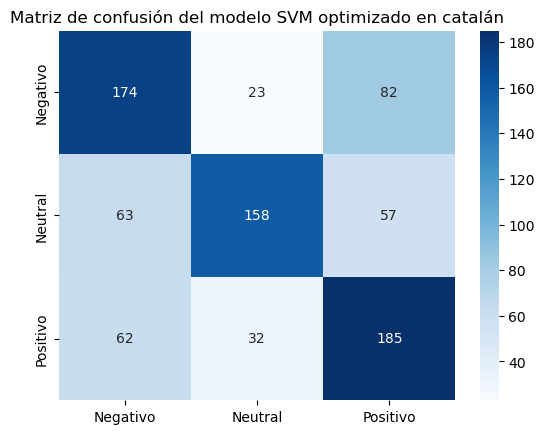

In [ ]:
# crear un mapa de calor con la matriz de confusión
conf_matrix_svm_ca = confusion_matrix(test_labels_ca, predicciones_svm_ca)
sns.heatmap(conf_matrix_svm_ca, annot=True, fmt='d', cmap='Blues', xticklabels=encoder_es.classes_, yticklabels=encoder_es.classes_)
plt.title('Matriz de confusión del modelo SVM optimizado en catalán')
plt.savefig('C:\\TFG\\Models\\confusion_matrix_svm_ca.png')

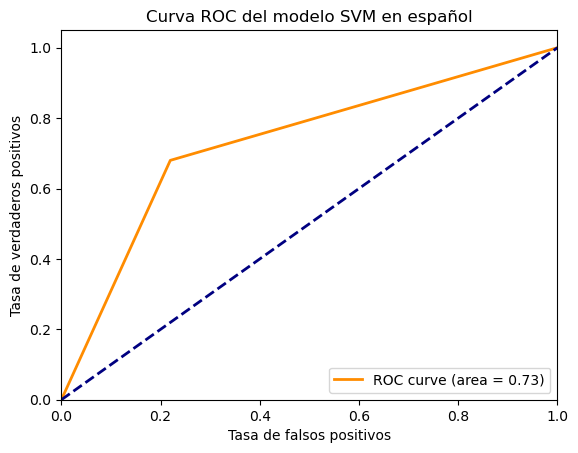

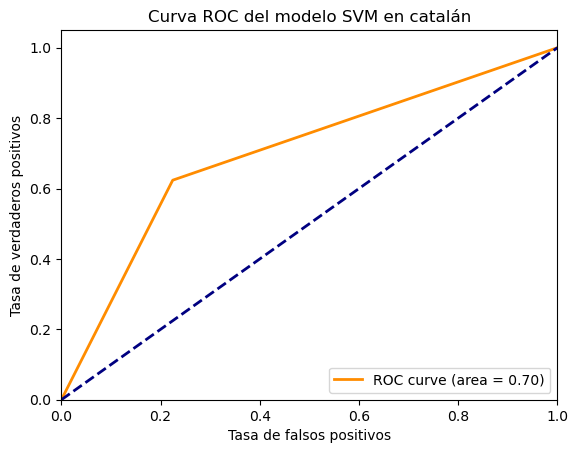

In [ ]:
# se binarizan las etiquetas
test_labels_es_bin = label_binarize(test_labels_es, classes=[0, 1, 2])
test_labels_ca_bin = label_binarize(test_labels_ca, classes=[0, 1, 2])

# se obtienen las predicciones de los modelos
predicciones_es = svm_es_grid.predict(test_sentences_es)
predicciones_ca = svm_ca_grid.predict(test_sentences_ca)

# se calculan las curvas roc
fpr_es = dict()
tpr_es = dict()
roc_auc_es = dict()
fpr_ca = dict()
tpr_ca = dict()
roc_auc_ca = dict()
for i in range(3):
    fpr_es[i], tpr_es[i], _ = roc_curve(test_labels_es_bin[:, i], predicciones_es == i)
    roc_auc_es[i] = auc(fpr_es[i], tpr_es[i])
    fpr_ca[i], tpr_ca[i], _ = roc_curve(test_labels_ca_bin[:, i], predicciones_ca == i)
    roc_auc_ca[i] = auc(fpr_ca[i], tpr_ca[i])

# se grafican las curvas roc
plt.figure()
lw = 2
plt.plot(fpr_es[0], tpr_es[0], color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc_es[0])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva ROC del modelo SVM en español')
plt.legend(loc="lower right")
plt.savefig('C:\\TFG\\Models\\roc_svm_es.png')

plt.figure()
lw = 2
plt.plot(fpr_ca[0], tpr_ca[0], color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc_ca[0])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva ROC del modelo SVM en catalán')
plt.legend(loc="lower right")
plt.savefig('C:\\TFG\\Models\\roc_svm_ca.png')

### Random Forest


In [69]:
textos_ca = independencia_df_ca_balanced['Texto_preprocesado'].apply(lambda x: ''.join(x))
labels_ca = independencia_df_ca_balanced['Sentimiento']
encoder = LabelEncoder()
etiquetas_ca_encoded = encoder.fit_transform(labels_ca)
# crear conjunto de train, test y valid
train_sentences_ca, test_sentences_ca, train_labels_ca, test_labels_ca = train_test_split(textos_ca, etiquetas_ca_encoded, stratify = etiquetas_ca_encoded, test_size = 0.2, random_state = 1335)
# crear conjunto de validación
test_sentences_ca, val_sentences_ca, test_labels_ca, val_labels_ca = train_test_split(test_sentences_ca, test_labels_ca, stratify = test_labels_ca, test_size = 0.25, random_state = 1335)


In [ ]:
start_time = time.time()
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer()),
    ('ada', AdaBoostClassifier(base_estimator= RandomForestClassifier(n_estimators=200, max_depth=5, min_samples_split=2, min_samples_leaf=1, max_features=3, criterion='gini', random_state=1335), n_estimators=100, learning_rate=0.1, random_state=1335))
])

pipeline.fit(train_sentences_ca, train_labels_ca)
scores_rf_ca = cross_val_score(pipeline, train_sentences_ca, train_labels_ca, cv=3)
scores_rf_ca_v1 = np.mean(scores_rf_ca)
predictions_rf_ca_v1 = pipeline.predict(test_sentences_ca)
rf_ca_v1_acc = accuracy_score(test_labels_ca, predictions_rf_ca_v1)
rf_ca_v1_pre = precision_score(test_labels_ca, predictions_rf_ca_v1, average='weighted')
rf_ca_v1_rec = recall_score(test_labels_ca, predictions_rf_ca_v1, average='weighted')
rf_ca_v1_f1 = f1_score(test_labels_ca, predictions_rf_ca_v1, average='weighted')
finish_time = time.time()
rf_ca_v1_time = finish_time - start_time

c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


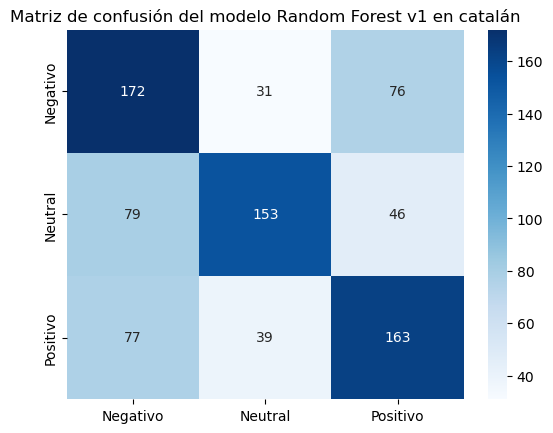

In [ ]:
# crear un mapa de calor con la matriz de confusión
conf_matrix_rf_ca_v1 = confusion_matrix(test_labels_ca, predictions_rf_ca_v1)
sns.heatmap(conf_matrix_rf_ca_v1, annot=True, fmt='d', cmap='Blues', xticklabels=encoder_es.classes_, yticklabels=encoder_es.classes_)
plt.title('Matriz de confusión del modelo Random Forest v1 en catalán')
plt.savefig('C:\\TFG\\Models\\confusion_matrix_rf_ca_v1.png')

In [ ]:
start_time = time.time()
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer()),
    ('ada', AdaBoostClassifier(estimator= RandomForestClassifier(n_estimators=200, max_depth=6, min_samples_split=3, min_samples_leaf=1, max_features=3, criterion='entropy', random_state=1335), n_estimators=200, learning_rate=0.01, random_state=1335))
])
pipeline.fit(train_sentences_ca, train_labels_ca)
scores_rf_ca = cross_val_score(pipeline, train_sentences_ca, train_labels_ca, cv=3)
scores_rf_ca_v2 = np.mean(scores_rf_ca)
# se realizan las predicciones
predictions_rf_ca_v2 = pipeline.predict(test_sentences_ca)
# se calcula la exactitud
rf_ca_v2_acc = accuracy_score(test_labels_ca, predictions_rf_ca_v2)
# se calcula la precisión
rf_ca_v2_pre = precision_score(test_labels_ca, predictions_rf_ca_v2, average = 'weighted')
# se calcula el recall
rf_ca_v2_rec = recall_score(test_labels_ca, predictions_rf_ca_v2, average = 'weighted')
# se calcula el f1
rf_ca_v2_f1 = f1_score(test_labels_ca, predictions_rf_ca_v2, average = 'weighted')
finish_time = time.time()
rf_ca_v2_time = finish_time - start_time

In [ ]:
# guardar modelo random forest con pickle
with open('C:\\TFG\\Models\\randomforest_ca_v2.pickle', 'wb') as dump_var:
    pickle.dump(pipeline, dump_var)

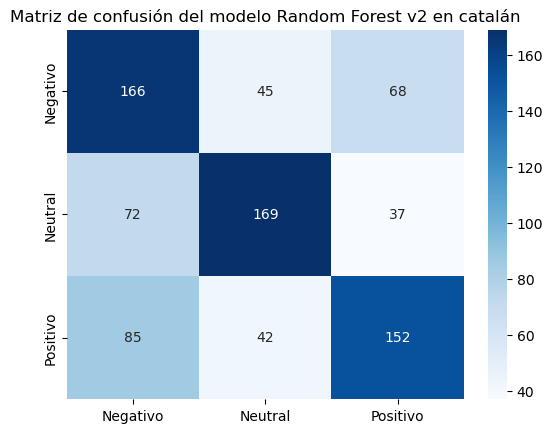

In [ ]:
# crear un mapa de calor con la matriz de confusión
conf_matrix_rf_ca_v2 = confusion_matrix(test_labels_ca, predictions_rf_ca_v2)
sns.heatmap(conf_matrix_rf_ca_v2, annot=True, fmt='d', cmap='Blues', xticklabels=encoder_es.classes_, yticklabels=encoder_es.classes_)
plt.title('Matriz de confusión del modelo Random Forest v2 en catalán')
plt.savefig('C:\\TFG\\Models\\confusion_matrix_rf_ca_v2.png')

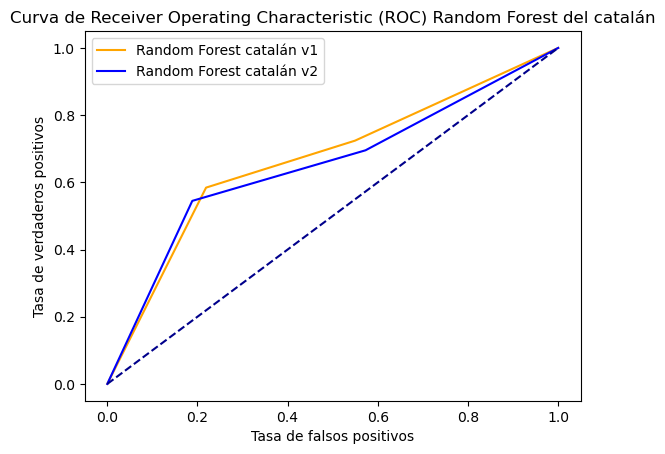

In [ ]:
fpr, tpr, thresholds = roc_curve(test_labels_ca, predictions_rf_ca_v1, pos_label = 2)
# gráfico de la curva roc
plt.plot(fpr, tpr, color='orange', label='Random Forest catalán v1')
fpr, tpr, thresholds = roc_curve(test_labels_ca, predictions_rf_ca_v2, pos_label = 2)
# gráfico de la curva roc
plt.plot(fpr, tpr, color='blue', label='Random Forest catalán v2')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva de Receiver Operating Characteristic (ROC) Random Forest del catalán')
plt.legend()
plt.savefig('C:\\TFG\Models\\roc_rf_ca.png')

In [ ]:
# Se realiza el mismo procedimiento para el dataset en español
textos_es = independencia_df_es_balanced['Texto_preprocesado'].apply(lambda x: ''.join(x))
labels_es = independencia_df_es_balanced['Sentimiento']
encoder_es = LabelEncoder()
etiquetas_es_encoded = encoder_es.fit_transform(labels_es)
# crear conjunto de train, test y valid en español
train_sentences_es, test_sentences_es, train_labels_es, test_labels_es = train_test_split(textos_es, etiquetas_es_encoded, stratify = etiquetas_es_encoded, test_size = 0.2, random_state = 1335)
# crear conjunto de validación
test_sentences_es, valid_sentences_es, test_labels_es, valid_labels_es = train_test_split(test_sentences_es, test_labels_es, stratify = test_labels_es, test_size = 0.25, random_state = 1335)


In [ ]:
start_time = time.time()
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer()),
    ('ada', AdaBoostClassifier(estimator= RandomForestClassifier(n_estimators = 200, max_depth = 5, min_samples_split = 2, min_samples_leaf = 1, max_features = 3, criterion = 'gini', random_state=1335), n_estimators=100, learning_rate=0.1, random_state=1335))
])

pipeline.fit(train_sentences_es, train_labels_es)
# se realiza la validación cruzada
scores_rf_es = cross_val_score(pipeline, train_sentences_es, train_labels_es, cv=3)
# se calcula la exactitud
scores_rf_es_v1 = np.mean(scores_rf_es)
# se realizan las predicciones
scores_rf_es = cross_val_score(pipeline, train_sentences_es, train_labels_es, cv=3)
scores_rf_es_v1 = np.mean(scores_rf_es)
predictions_rf_es_v1 = pipeline.predict(test_sentences_es)
# se calcula la exactitud
rf_es_v1_acc = accuracy_score(test_labels_es, predictions_rf_es_v1)
# se calcula la precisión
rf_es_v1_pre = precision_score(test_labels_es, predictions_rf_es_v1, average = 'weighted')
# se calcula el recall
rf_es_v1_rec = recall_score(test_labels_es, predictions_rf_es_v1, average = 'weighted')
# se calcula el f1
rf_es_v1_f1 = f1_score(test_labels_es, predictions_rf_es_v1, average = 'weighted')
finish_time = time.time()
rf_es_v1_time = finish_time - start_time

In [ ]:
# guardar modelo random forest con pickle
with open('C:\\TFG\\Models\\randomforest_es_v1.pickle', 'wb') as dump_var:
    pickle.dump(pipeline, dump_var)

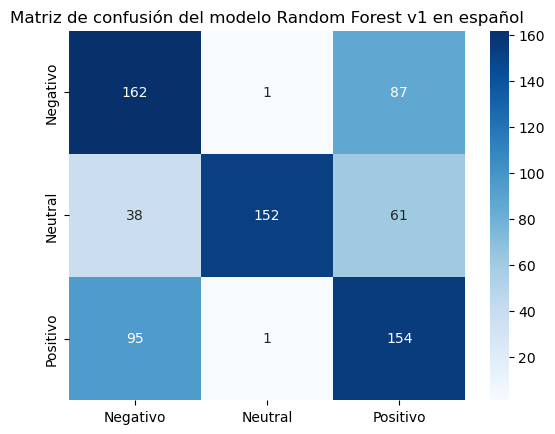

In [ ]:
# crear un mapa de calor con la matriz de confusión
conf_matrix_rf_es_v1 = confusion_matrix(test_labels_es, predictions_rf_es_v1)
sns.heatmap(conf_matrix_rf_es_v1, annot=True, fmt='d', cmap='Blues', xticklabels=encoder_es.classes_, yticklabels=encoder_es.classes_)
plt.title('Matriz de confusión del modelo Random Forest v1 en español')
plt.savefig('C:\\TFG\\Models\\confusion_matrix_rf_es_v1.png')

In [ ]:
start_time = time.time()
pipeline = Pipeline([
    ('vectorizer', TfidfVectorizer()),
    ('ada', AdaBoostClassifier(estimator= RandomForestClassifier(n_estimators=200, max_depth=6, min_samples_split=3, min_samples_leaf=1, max_features=3, criterion='entropy', random_state=1335), n_estimators=200, learning_rate=0.01, random_state=1335))
])

pipeline.fit(train_sentences_es, train_labels_es)
# se realiza la validación cruzada
scores_rf_es = cross_val_score(pipeline, train_sentences_es, train_labels_es, cv=3)
# se calcula la exactitud
scores_rf_es_v2 = np.mean(scores_rf_es)
# se realizan las predicciones
scores_rf_es = cross_val_score(pipeline, train_sentences_es, train_labels_es, cv=3)
scores_rf_es_v2 = np.mean(scores_rf_es)
predictions_rf_es_v2 = pipeline.predict(test_sentences_es)
# se calcula la exactitud
rf_es_v2_acc = accuracy_score(test_labels_es, predictions_rf_es_v2)
# se calcula la precisión
rf_es_v2_pre = precision_score(test_labels_es, predictions_rf_es_v2, average = 'weighted')
# se calcula el recall
rf_es_v2_rec = recall_score(test_labels_es, predictions_rf_es_v2, average = 'weighted')
# se calcula el f1
rf_es_v2_f1 = f1_score(test_labels_es, predictions_rf_es_v2, average = 'weighted')
finish_time = time.time()
rf_es_v2_time = finish_time - start_time


In [ ]:
# guardar modelo random forest con pickle
with open('C:\\TFG\\Models\\randomforest_es_v2.pickle', 'wb') as dump_var:
    pickle.dump(pipeline, dump_var)

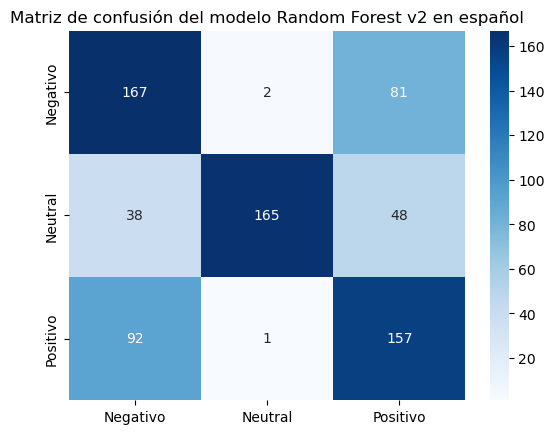

In [ ]:
# crear un mapa de calor con la matriz de confusión
conf_matrix_rf_es_v2 = confusion_matrix(test_labels_es, predictions_rf_es_v2)
sns.heatmap(conf_matrix_rf_es_v2, annot=True, fmt='d', cmap='Blues', xticklabels=encoder_es.classes_, yticklabels=encoder_es.classes_)
plt.title('Matriz de confusión del modelo Random Forest v2 en español')
plt.savefig('C:\\TFG\\Models\\confusion_matrix_rf_es_v2.png')

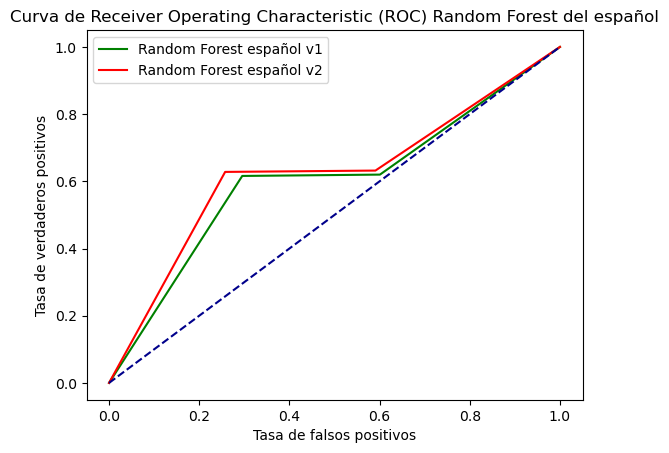

In [ ]:
fpr, tpr, thresholds = roc_curve(test_labels_es, predictions_rf_es_v1, pos_label = 2)
# gráfico de la curva roc
plt.plot(fpr, tpr, color='green', label='Random Forest español v1')
fpr, tpr, thresholds = roc_curve(test_labels_es, predictions_rf_es_v2, pos_label = 2)
# gráfico de la curva roc
plt.plot(fpr, tpr, color='red', label='Random Forest español v2')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva de Receiver Operating Characteristic (ROC) Random Forest del español')
plt.legend()
plt.savefig('C:\\TFG\\Models\\roc_rf_es.png')

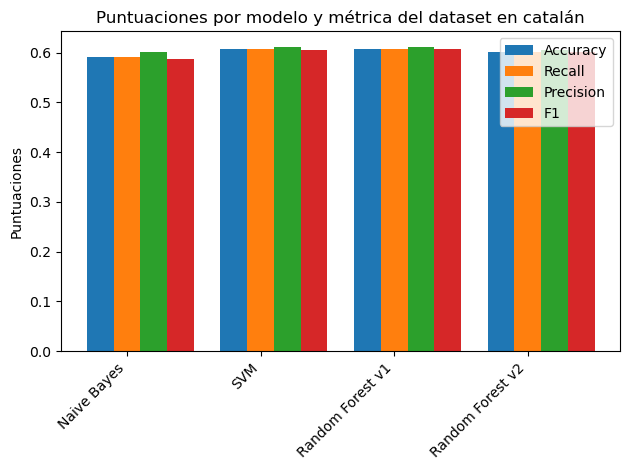

In [ ]:
# se definen las etiquetas
labels = ['Naive Bayes','SVM', 'Random Forest v1', 'Random Forest v2']
# se definen los valores de las métricas
accuracy = [ nb_ca_acc, svm_ca_acc, rf_ca_v1_acc, rf_ca_v2_acc]
recall = [nb_ca_rec, svm_ca_rec, rf_ca_v1_rec, rf_ca_v2_rec]
precision = [nb_ca_pre, svm_ca_prec, rf_ca_v1_pre, rf_ca_v2_pre]
f1 = [nb_ca_f1, svm_ca_f1, rf_ca_v1_f1, rf_ca_v2_f1]
x = np.arange(len(labels))
width = 0.2
fig, ax = plt.subplots()
rects1 = ax.bar(x - width, accuracy, width, label='Accuracy')
rects2 = ax.bar(x, recall, width, label='Recall')
rects3 = ax.bar(x + width, precision, width, label='Precision')
rects4 = ax.bar(x + 2*width, f1, width, label='F1')
ax.set_ylabel('Puntuaciones')
ax.set_title('Puntuaciones por modelo y métrica del dataset en catalán')
ax.set_xticks(x)
ax.legend()
ax.set_xticklabels(labels, rotation=45, ha='right')
fig.tight_layout()
plt.savefig('C:\TFG\Models\comparativa_metricas_ca.png')

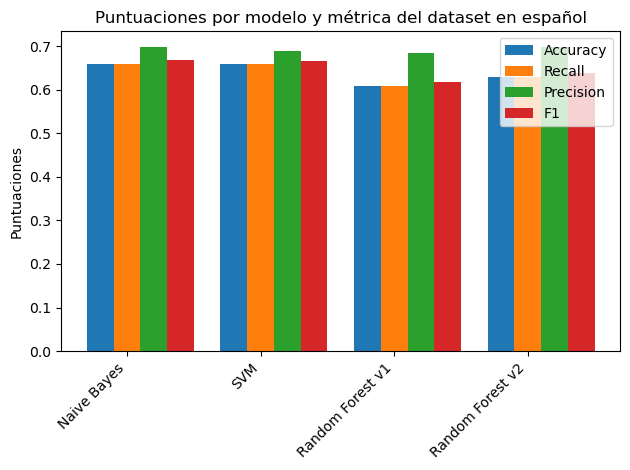

In [ ]:
# se definen las etiquetas
labels = ['Naive Bayes','SVM', 'Random Forest v1', 'Random Forest v2']
# se definen los valores de las métricas del dataset en español
accuracy = [nb_es_acc, svm_es_acc, rf_es_v1_acc, rf_es_v2_acc]
recall = [nb_es_rec, svm_es_rec, rf_es_v1_rec, rf_es_v2_rec]
precision = [nb_es_prec, svm_es_prec, rf_es_v1_pre, rf_es_v2_pre]
f1 = [nb_es_f1, svm_es_f1, rf_es_v1_f1, rf_es_v2_f1]
x = np.arange(len(labels))
width = 0.2
fig, ax = plt.subplots()
rects1 = ax.bar(x - width, accuracy, width, label='Accuracy')
rects2 = ax.bar(x, recall, width, label='Recall')
rects3 = ax.bar(x + width, precision, width, label='Precision')
rects4 = ax.bar(x + 2*width, f1, width, label='F1')
ax.set_ylabel('Puntuaciones')
ax.set_title('Puntuaciones por modelo y métrica del dataset en español')
ax.set_xticks(x)
ax.legend()
ax.set_xticklabels(labels, rotation=45, ha='right')
fig.tight_layout()
plt.savefig('C:\TFG\Models\comparativa_metricas_es.png')

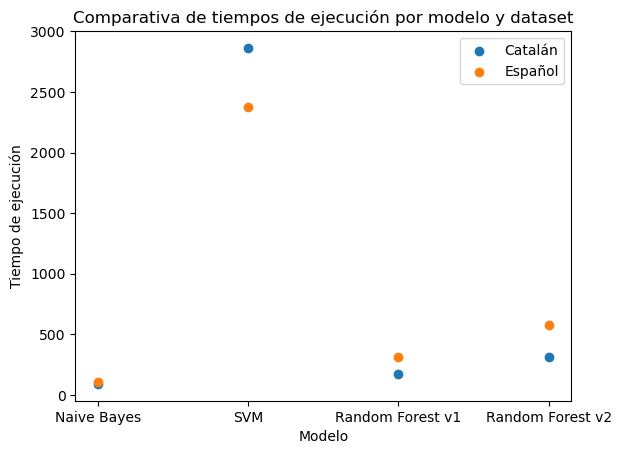

In [ ]:
# gráfico de puntos con la comparativa de times
plt.scatter(['Naive Bayes', 'SVM', 'Random Forest v1', 'Random Forest v2'], [nb_ca_time, svm_ca_time, rf_ca_v1_time, rf_ca_v2_time], label='Catalán')
plt.scatter(['Naive Bayes', 'SVM', 'Random Forest v1', 'Random Forest v2'], [nb_es_time, svm_es_time, rf_es_v1_time, rf_es_v2_time], label='Español')
plt.xlabel('Modelo')
plt.ylabel('Tiempo de ejecución')
plt.title('Comparativa de tiempos de ejecución por modelo y dataset')
plt.legend()
plt.savefig('C:\\TFG\\Models\\comparativa_tiempos_ejecución.png')


Llegado a este punto, la optimización del modelo en catalán mediante Random Forest es la más eficiente en cuanto a tiempo de ejecución y métricas, mientras que el modelo en español mediante Naive Bayes es el más eficiente por los mismos motivos. En todo caso, el rango de métricas oscila entre 0.6 y 0.7, lo cual no supone un buen rendimiento del modelo. Por lo que se deberán implementar técnicas avanzadas de NLP para mejorar la precisión del modelo.

Cabe destacar que la optimización del modelo Random Forest se ha visto truncada debido a la incompatibilidad de Grid Search y Adaboost . El mensaje de error del terminal de Python indica claramente que este nivel de arquitectura requiere de Transformers. Se adjunta más abajo una descripción del problema. Por este motivo, la motivación del incremento del producto será implementar técnicas avanzadas de NLP mediante deep learning. Usaré Transformers, Embeddings y evaluaré distintas opciones para encontrar el modelo más eficiente .

Límite de arquitectura alcanzada, se adjunta mensaje de error:

Below are more details about the failures:
--------------------------------------------------------------------------------
36 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 401, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 339, in _fit
    self._validate_steps()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 230, in _validate_steps
    raise TypeError(
TypeError: **All intermediate steps should be transformers** and implement fit and transform or be the string 'passthrough' 'RandomForestClassifier(max_depth=5, max_features=3, random_state=1335)' (type <class 'sklearn.ensemble._forest.RandomForestClassifier'>) doesn't

Con este mensaje de error se establece un punto de partida para la segunda parte de la investigación, donde se aborda el problema de clasificación de emociones mediante la arquitectura de transformers. La hipótesis de partida es que los modelos avanzados de NLP permitirán mejorar la precisión del modelo y el entendimiento del significado de las palabras, gracias a la auto atención. Para esto, será necesario entrenar un modelo desde cero, y se hará uso de las clases y la programación orientada a objetos. Este es un objetivo principal del trabajo final, por lo que se experimentará con distintas arquitecturas de transformers y se evaluará la precisión del modelo. 

El objetivo final será realizar una crítica hacia las arquitecturas más ingenuas, a favor de arquitecturas que son capaces de entender el significado del contexto de una frase completa y clasificar el sentimiento a partir de un LLM (Language Model) preentrenado en vez de un etiquetado manual por parte de expertos que pueden introducir sesgo en las etiquetas.

In [ ]:
# guarda las métricas en un dataframe
df_metricas = pd.DataFrame()
df_metricas['Modelo'] = ['Naive Bayes', 'SVM', 'Random Forest v1', 'Random Forest v2']
df_metricas['Accuracy_ca'] = [nb_ca_acc, svm_ca_acc, rf_ca_v1_acc, rf_ca_v2_acc]
df_metricas['Recall_ca'] = [nb_ca_rec, svm_ca_rec, rf_ca_v1_rec, rf_ca_v2_rec]
df_metricas['Precision_ca'] = [nb_ca_pre, svm_ca_prec, rf_ca_v1_pre, rf_ca_v2_pre]
df_metricas['F1_ca'] = [nb_ca_f1, svm_ca_f1, rf_ca_v1_f1, rf_ca_v2_f1]
df_metricas['Accuracy_es'] = [nb_es_acc, svm_es_acc, rf_es_v1_acc, rf_es_v2_acc]
df_metricas['Recall_es'] = [nb_es_rec, svm_es_rec, rf_es_v1_rec, rf_es_v2_rec]
df_metricas['Precision_es'] = [nb_es_prec, svm_es_prec, rf_es_v1_pre, rf_es_v2_pre]
df_metricas['F1_es'] = [nb_es_f1, svm_es_f1, rf_es_v1_f1, rf_es_v2_f1]
df_metricas['Time_ca'] = [nb_ca_time, svm_ca_time, rf_ca_v1_time, rf_ca_v2_time]
df_metricas['Time_es'] = [nb_es_time, svm_es_time, rf_es_v1_time, rf_es_v2_time]
df_metricas.to_csv('C:\\TFG\\DataProcessed\\metricas_modelos.csv', index=False)
